In [1]:
#imports
import pandas as pd
import numpy as np
import matplotlib as mpl
from matplotlib import rcParams
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib import cycler
from matplotlib.ticker import StrMethodFormatter
from matplotlib.axis import Axis
from matplotlib.patches import FancyBboxPatch
from matplotlib.font_manager import FontProperties
import sqlite3 as sq
from functools import reduce
#settings
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.width', 150)
pd.options.mode.chained_assignment = None  # default='warn'
from warnings import simplefilter
simplefilter(action="ignore", category=pd.errors.PerformanceWarning)
import sys
sys.path.append("../../Functions and Dictionaries/") # Adds higher directory to python modules path
import geodict
namestocommon = geodict.namestocommon

In [2]:
import vizfunctions2
prettypercentchange = vizfunctions2.prettypercentchange #single viz per x axis unit datalabels, active inputs: xoffset, yoffset, labelformat
percentchange = vizfunctions2.percentchange #double viz per x axis unit datalabels, active inputs: xoffset1, yoffset1, xoffset2, yoffset2, labelformat, size
percent = vizfunctions2.percent
percentchange = vizfunctions2.percentchange
realchange = vizfunctions2.realchange

In [3]:
import changefunctions
calculate_changes = changefunctions.calculate_changes
generate_time_frames = changefunctions.generate_time_frames

In [4]:
import vizfunctions
#allheaders = vizfunctions.allheaders
#howwide = vizfunctions.howwide
tablecolors = vizfunctions.tablecolors
#allheadersmerged = vizfunctions.allheadersmerged
#makeinvisible = vizfunctions.makeinvisible
mergecells = vizfunctions.mergecells
mergemultcells = vizfunctions.mergemultcells

In [5]:
#data labels functions
def singledatalabels(xoffset, yoffset, labelformat):
    for j, k in zip(x, y):
        label = labelformat.format(k)
        plt.annotate(label, (j, k), textcoords = 'offset points', xytext = (xoffset, yoffset), ha = 'center')
boxstyleinput = "round,pad=-0.060,rounding_size=0.15"
def roundedboxes(boxstyleinput):
    new_patches = []
    for patch in reversed(ax.patches):
        bb = patch.get_bbox()
        color=patch.get_facecolor()
        p_bbox = FancyBboxPatch((bb.xmin, bb.ymin),abs(bb.width), abs(bb.height),boxstyle=boxstyleinput, ec="none", fc=color, mutation_aspect=1)
        patch.remove()
        new_patches.append(p_bbox)
    for patch in new_patches:
        ax.add_patch(patch)
def howwide(width):
    ['None' for x in range(width)]
def howlong(indexlength):
    ["None" for x in range(indexlength)]
col1, col2, edge1, edge2 = '#00263E', '#E1EFF2', 'vertical', 'horizontal'
def allheadersmerged(col1, col2, edge1, edge2):
    for cell in table.get_children():
        cell_text = cell.get_text().get_text()
        if cell_text not in row_headers\
        and cell_text not in doublecols:
            cell.set_edgecolor(col1)
        elif cell_text in column_headers:
            cell.set_edgecolor(None)
        else:
            cell.set(edgecolor=col2)
        if cell_text in column_headers:
            cell.visible_edges = 'B'
        elif cell_text in row_headers:
            cell.visible_edges = edge2
        elif cell_text in col_names:
            cell.visible_edges = 'LR'
        if cell_text in row_headers\
        or cell_text in doublecols:
            cell.set_text_props(fontproperties=FontProperties(weight='bold'))
#function to make figure invisible for tables
guy1, guy2, guy3 = False, 'off', 'tight'
def makeinvisible(guy1, guy2, guy3):
    return fig.patch.set_visible(guy1), ax.axis(guy2), ax.axis(guy3)
col1, col2, edge1, edge2 = '#00263E', '#E1EFF2', 'vertical', 'horizontal'
def allheaders(col1, col2, edge1, edge2):
    for cell in table.get_children():
        cell_text = cell.get_text().get_text()
        if cell_text not in row_headers\
        and cell_text not in column_headers:
            cell.set_edgecolor(col1)
        else:
            cell.set(edgecolor=col2)
    for cell in table.get_children():
        cell_text = cell.get_text().get_text()
        if cell_text in column_headers:
            cell.visible_edges = edge1
        elif cell_text in row_headers:
            cell.visible_edges = edge2
    for cell in table.get_children():
        cell_text = cell.get_text().get_text()
        if cell_text in row_headers\
        or cell_text in column_headers:
            cell.set_text_props(fontproperties=FontProperties(weight='bold'))
#stacked bar labels function
belowstackedbarlabels, abovestackedbarlabels = -5, 2
def stackedbarlabels(locationoffset):
    for bar in ax.patches:
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + bar.get_y() + locationoffset, str(float(round(bar.get_height(), 1))) + '%', ha='center')
def doubledatalabels(xoffset1, yoffset1, xoffset2, yoffset2, labelformat, size):
    for j, k in zip(xpos, y1):
        label = labelformat.format(k)
        ax.annotate(label, (j, k), textcoords = 'offset points', xytext = (xoffset1, yoffset1), fontsize = size, ha = 'center')
    for j, k in zip(xpos, y2):
        label = labelformat.format(k)
        ax.annotate(label, (j, k), textcoords = 'offset points', xytext = (xoffset2, yoffset2), fontsize = size, ha = 'center')

In [6]:
#Set branding parameters
GNRCDARKBLUE, GNRCLIGHTBLUE, GNRCORANGE, GNRCCOOLGRAY= '#00263E', '#6DB0C7', '#EB7525', '#7B7E85'
C1, C2, C3, C4, C5, C6, C7, C8, C9 = '#d0dd28', '#d6d0d3', '#696466', '#62a67f', '#92c83e', '#0C2428', '#414543', '#a9d6bd', '#e8ebbc'
TABLECOL1, TABLECOL2 = '#E1EFF2', '#F4F9F9'
GNRCFONTONE, GNRCFONTTWO, GNRCFONTTHREE = 'Calibri', 'DIN Condensed', 'Palatino Linotype'
SMALLER_SIZE, SMALL_SIZE, MEDIUM_SIZE, BIGGER_SIZE, BIGGEST_SIZE = 10, 11, 13, 18, 20
#Update the default style sheet using rcparams
plt.rcParams.update({'font.size': SMALL_SIZE, 'font.weight': 'normal', 'axes.titlesize': BIGGER_SIZE, 'axes.labelsize': MEDIUM_SIZE, 'xtick.labelsize': SMALL_SIZE, 
'ytick.labelsize': SMALL_SIZE, 'legend.fontsize': SMALL_SIZE, 'font.family': GNRCFONTONE, 'axes.facecolor': 'None', 'figure.figsize': (10, 5), 
'figure.facecolor': 'None', 'figure.edgecolor': 'None', 'figure.autolayout': True, 'figure.dpi': 500, 'axes.grid': False, 'axes.grid.which': 'major', 
'axes.axisbelow': True, 'text.color': GNRCDARKBLUE, 'axes.labelcolor': GNRCDARKBLUE, 'xtick.color': GNRCCOOLGRAY, 'ytick.color': GNRCCOOLGRAY, 
'axes.labelpad': 15, 'axes.titlepad': 20, 'grid.color': GNRCCOOLGRAY, 'grid.linestyle': '-', 'grid.alpha': '0.7', 'lines.linewidth': 1.5, 
'lines.linestyle': '-', 'lines.marker': 'o', 'legend.framealpha': 0.8, 'legend.facecolor': 'inherit', 'legend.frameon': False,
'axes.prop_cycle': cycler(color = [C1, C2, C3, C4, C5, C6, C7, C8, C9, GNRCLIGHTBLUE]), 
'axes.spines.top': False, 'axes.spines.right': False, 'axes.spines.bottom': False, 'axes.spines.left': False, 'xtick.major.size': 8, 
'xtick.minor.size': 4, 'ytick.major.size': 6, 'ytick.minor.size': 3, 'ytick.minor.size': 3})
#Settings not available in rcparams
tickaxisselection = 'both'                  #both axes have ticks
majororminortick = 'major'                  #only major ticks selected for now, although we just established a default size for the minor if we want them
linealpha = 0.8                             #no rcparam, set this as alpha for line plots
#AXIS LABEL FORMATTERS
yearformat = '{x:.0f}'                       #takes float datatype to look like a year
numbernodecimalformat = '{x:,.0f}'           #takes float datatype to a number with no decimal with commas at the thousandth
numberonedecimalformat = '{x:,.1f}'          #takes float datatype to a number with one decimal with commas at the thousandth
numbertwodecimalformat = '{x:,.2f}'          #takes float datatype to a number with two decimal with commas at the thousandth
percentformat = '{x:,.1f}%'                  #takes float datatype to a number with one decimal with commas at the thousandth and an appended %
percentnodecimalformat = '{x:,.0f}%'         #takes float datatype to a number with one decimal with commas at the thousandth and an appended %
moneyformat = '${x:,.0f}'                    #takes float datatype to a number with no decimal with commas at the thousandth and a MONEY sign   

In [8]:
#2000
conn = sq.connect('../../../Data-Pipelines/Outputs/CensusBureau.db')
#SF12000
sql_query = pd.read_sql('SELECT * FROM [CensusBureau_SF1_2000]', conn)
sf12000 = pd.DataFrame(sql_query)
sf12000.drop(columns = 'Source', inplace = True)
#SF32000
sql_query = pd.read_sql('SELECT * FROM [CensusBureau_SF3_2000]', conn)
sf32000 = pd.DataFrame(sql_query)
sf32000.drop(columns = 'Source', inplace = True)
#TIGER2000
sql_query = pd.read_sql('SELECT * FROM [CensusBureau_TIGER_2000]', conn)
TIGER2000 = pd.DataFrame(sql_query)
TIGER2000.drop(columns = 'Source', inplace = True)
dfs2000 = [TIGER2000, sf12000, sf32000]
twothousand= reduce(lambda  left,right: pd.merge(left,right,on=['NAME', 'GEO_ID'], how='outer'), dfs2000)
twothousand = twothousand.set_index(['NAME', 'GEO_ID'])
twothousandsuff = twothousand.add_suffix(' 2000')
#twothousand.columns = pd.MultiIndex.from_product([twothousand.columns, [2000], ['None']])
#2010
#SF12010
sql_query = pd.read_sql('SELECT * FROM [CensusBureau_SF1_2010]', conn)
sf12010 = pd.DataFrame(sql_query)
sf12010.drop(columns = 'Source', inplace = True)
#ACS52010
sql_query = pd.read_sql('SELECT * FROM [CensusBureau_ACS5_2010]', conn)
ACS52010 = pd.DataFrame(sql_query)
ACS52010.drop(columns = 'Source', inplace = True)
#TIGER2010
sql_query = pd.read_sql('SELECT * FROM [CensusBureau_TIGER_2010]', conn)
TIGER2010 = pd.DataFrame(sql_query)
TIGER2010.drop(columns = 'Source', inplace = True)
dfs2010 = [TIGER2010, sf12010, ACS52010]
twothousandten= reduce(lambda  left,right: pd.merge(left,right,on=['NAME', 'GEO_ID'], how='outer'), dfs2010)
twothousandten = twothousandten.fillna(0)
twothousandten = twothousandten.set_index(['NAME', 'GEO_ID'])
twothousandtensuff = twothousandten.add_suffix(' 2010')
#twothousandten.columns = pd.MultiIndex.from_product([twothousandten.columns, [2010], ['None']])
#2020
#PL2010
sql_query = pd.read_sql('SELECT * FROM [CensusBureau_PL_2020]', conn)
pl2020 = pd.DataFrame(sql_query)
pl2020.drop(columns = 'Source', inplace = True)
#TIGER2020
sql_query = pd.read_sql('SELECT * FROM [CensusBureau_TIGER_2020]', conn)
TIGER2020 = pd.DataFrame(sql_query)
TIGER2020.drop(columns = 'Source', inplace = True)
dfs2020 = [TIGER2020, pl2020]
twothousandtwenty= reduce(lambda  left,right: pd.merge(left,right,on=['NAME', 'GEO_ID'], how='outer'), dfs2020)
twothousandtwenty = twothousandtwenty.fillna(0)
twothousandtwenty = twothousandtwenty.set_index(['NAME', 'GEO_ID'])
#twothousandtwenty = twothousandtwenty.drop(columns = groupquarters)
twothousandtwentysuff = twothousandtwenty.add_suffix(' 2020')
#twothousandtwenty.columns = pd.MultiIndex.from_product([twothousandtwenty.columns, [2020], ['None']])

In [9]:
geos = ['Sumner County', 'Gallatin', 'Millersville', 'Goodlettsville', 'Hendersonville', 'Portland', 
        'Westmoreland', 'Mitchellville', 'White House']

In [10]:
dfs = [twothousandsuff, twothousandtensuff, twothousandtwentysuff]
dfsuff = reduce(lambda  left,right: pd.merge(left,right, on = ['NAME', 'GEO_ID'], how='outer'), dfs)

In [11]:
dfsuff = dfsuff.reset_index().set_index('NAME').transpose()
dfsuff = dfsuff.rename(columns = namestocommon)
dfsuff = dfsuff[geos]
dfsuff = dfsuff.transpose().reset_index()

In [12]:
cols = list(dfsuff.columns)
cols.remove('NAME')
cols.remove('GEO_ID')
dfsuff[cols] = dfsuff[cols].astype(float)

In [13]:
twothousand.columns = pd.MultiIndex.from_product([twothousand.columns, [2000], ['None']])
twothousandten.columns = pd.MultiIndex.from_product([twothousandten.columns, [2010], ['None']])
twothousandtwenty.columns = pd.MultiIndex.from_product([twothousandtwenty.columns, [2020], ['None']])

In [14]:
#all years tidy
dfs = [twothousand, twothousandten, twothousandtwenty]
dftidy = reduce(lambda  left,right: pd.merge(left,right,on=['NAME', 'GEO_ID'], how='outer'), dfs)

In [15]:
years = [2000, 2010, 2020]
time_frames = generate_time_frames(years)

In [16]:
value_counts = dftidy.columns.get_level_values(0).value_counts()
first_level = value_counts[value_counts == 3].index.tolist()
#remove percentages - don't want change metrics on them
first_level = [item for item in first_level if '%' not in item]

In [17]:
#pass the dataframe, the list of variables, time frames, and years through the "calculate change" function
dftidy = calculate_changes(dftidy, first_level, time_frames = time_frames, years = years)

In [18]:
#reformat and rename columns
dftidy = dftidy.stack([1, 1])
dftidy = dftidy.reset_index(drop = False)
dftidy = dftidy.rename(columns = {'level_2':'Year', 'level_3':'Time Frame'})

In [19]:
dftidy = dftidy.set_index('NAME').transpose()
dftidy = dftidy.rename(columns = namestocommon)
dftidy = dftidy[geos]
dftidy = dftidy.transpose().reset_index()
dftidy['Year'] = dftidy['Year'].replace({'None': 0})

In [20]:
cols = list(dftidy.columns)
cols.remove("GEO_ID")
cols.remove('Time Frame')
cols.remove('NAME')
dftidy[cols] = dftidy[cols].astype(float)

In [21]:
#set primary geo for colors
primarygeo = 'Millersville'
county = 'Sumner County'
#quick geo filters
reggeos = dftidy.loc[(dftidy['NAME'] == 'Sumner County')|
                     (dftidy['NAME'] == 'Gallatin')|(dftidy['NAME'] == 'Goodlettsville')|(dftidy['NAME'] == 'Hendersonville')|
                     (dftidy['NAME'] == 'Millersville')|(dftidy['NAME'] == 'Mitchellville')|(dftidy['NAME'] == 'Portland')|(dftidy['NAME'] == 'Westmoreland')|
                     (dftidy['NAME'] == 'White House')].reset_index(drop = True)
reggeost = dfsuff.loc[(dfsuff['NAME'] == 'Sumner County')|
                      (dfsuff['NAME'] == 'Gallatin')|(dfsuff['NAME'] == 'Goodlettsville')|(dfsuff['NAME'] == 'Hendersonville')|(dfsuff['NAME'] == 'Millersville')|
                      (dfsuff['NAME'] == 'Mitchellville')|(dfsuff['NAME'] == 'Portland')|(dfsuff['NAME'] == 'Westmoreland')|
                      (dfsuff['NAME'] == 'White House')].reset_index(drop = True)
reggeosnocounty = dftidy.loc[(dftidy['NAME'] == 'Gallatin')|(dftidy['NAME'] == 'Goodlettsville')|(dftidy['NAME'] == 'Hendersonville')|
                             (dftidy['NAME'] == 'Millersville')|(dftidy['NAME'] == 'Mitchellville')|(dftidy['NAME'] == 'Portland')|(dftidy['NAME'] == 'Westmoreland')|
                             (dftidy['NAME'] == 'White House')].reset_index(drop = True)
reggeosnocountyt = dfsuff.loc[(dfsuff['NAME'] == 'Gallatin')|(dfsuff['NAME'] == 'Goodlettsville')|(dfsuff['NAME'] == 'Hendersonville')|
                              (dfsuff['NAME'] == 'Millersville')|(dfsuff['NAME'] == 'Mitchellville')|(dfsuff['NAME'] == 'Portland')|
                              (dfsuff['NAME'] == 'Westmoreland')|(dfsuff['NAME'] == 'White House')].reset_index(drop = True)
Primary = dftidy.loc[dftidy['NAME'] == 'Millersville']
Primaryt = dfsuff.loc[dfsuff['NAME'] == 'Millersville']
County = dftidy.loc[dftidy['NAME'] == 'Sumner County']
Countyt = dfsuff.loc[dfsuff['NAME'] == 'Sumner County']
Gallatin = dftidy.loc[dftidy['NAME'] == 'Gallatin']
Gallatint = dfsuff.loc[dfsuff['NAME'] == 'Gallatin']
Goodlettsville = dftidy.loc[dftidy['NAME'] == 'Goodlettsville']
Goodlettsvillet = dfsuff.loc[dfsuff['NAME'] == 'Goodlettsville']
Hendersonville = dftidy.loc[dftidy['NAME'] == 'Hendersonville']
Hendersonvillet = dfsuff.loc[dfsuff['NAME'] == 'Hendersonville']
Millersville = dftidy.loc[dftidy['NAME'] == 'Millersville']
Millersvillet = dfsuff.loc[dfsuff['NAME'] == 'Millersville']
Mitchellville = dftidy.loc[dftidy['NAME'] == 'Mitchellville']
Mitchellvillet = dfsuff.loc[dfsuff['NAME'] == 'Mitchellville']
Portland = dftidy.loc[dftidy['NAME'] == 'Portland']
Portlandt = dfsuff.loc[dfsuff['NAME'] == 'Portland']
Westmoreland = dftidy.loc[dftidy['NAME'] == 'Westmoreland']
Westmorelandt = dfsuff.loc[dfsuff['NAME'] == 'Westmoreland']
WhiteHouse = dftidy.loc[dftidy['NAME'] == 'White House']
WhiteHouset = dfsuff.loc[dfsuff['NAME'] == 'White House']

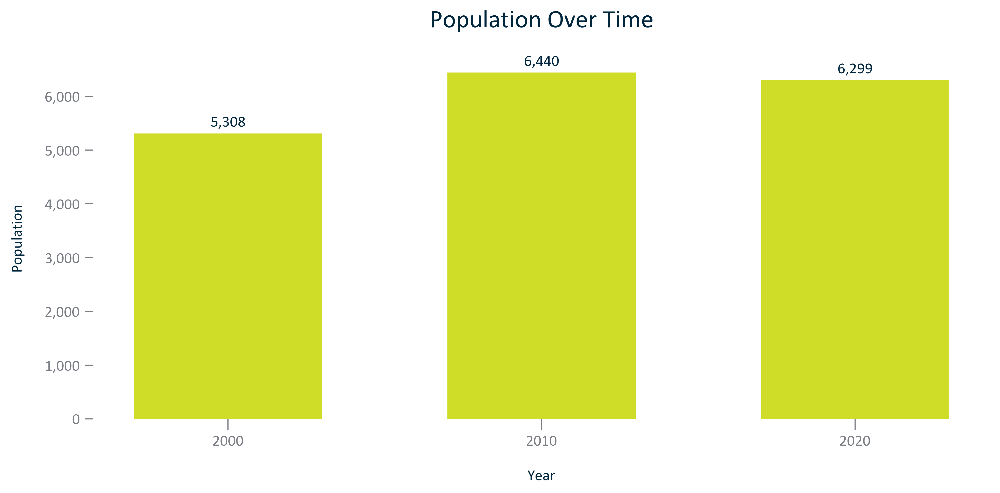

In [22]:
title = 'Population Over Time'
df_temp = Primary.loc[Primary['Time Frame'] == 'None']
df_temp = df_temp.loc[df_temp['Population'].notnull()]
df_temp = df_temp[['NAME', 'Year', 'Population']]
xinput = 'Year'
yinput = 'Population'
xlabel = xinput
ylabel = yinput
x = df_temp[xinput]
y = df_temp[yinput]
#initiate figure and set parameters
fig, ax = plt.subplots()
ax.bar(x, y, width = 6) 
ax.set(title = title, xlabel = xlabel, ylabel = ylabel) #set the title and axes labels
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter(numbernodecimalformat)) #y axis formatting
plt.locator_params(axis='x', nbins=3)
#data labels
singledatalabels(0, 5, "{:,.0f}")
#display and save
fig.savefig('../Figures/POP_bar_primarygeo_population_overtime.svg', bbox_inches='tight')
fig.savefig('../Figures/POP_bar_primarygeo_population_overtime.png', bbox_inches='tight')
with open('../Figures/POP_bar_primarygeo_population_overtime.txt', 'w') as text_file:
    text_file.write('Citation: 2000, 2010, and 2020 Decennial Census')
plt.show()
plt.close();

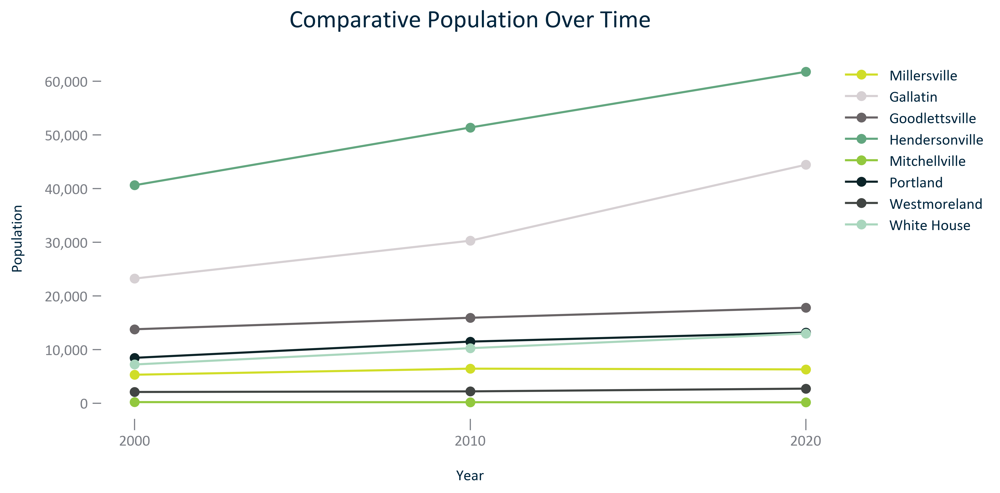

In [23]:
title = 'Comparative Population Over Time'
#set up temporary dataframe
xinput = 'Year'
yinput = 'Population'
df_temp0 = Hendersonville
linelabel0 = str(df_temp0['NAME'].values[0])
x0 = df_temp0[xinput]
y0 = df_temp0[yinput]
df_temp1 = Gallatin
linelabel1 = str(df_temp1['NAME'].values[0])
x1 = df_temp1[xinput]
y1 = df_temp1[yinput]
df_temp2 = Goodlettsville
linelabel2 = str(df_temp2['NAME'].values[0])
x2 = df_temp2[xinput]
y2 = df_temp2[yinput]
df_temp3 = Portland
linelabel3 = str(df_temp3['NAME'].values[0])
x3 = df_temp3[xinput]
y3 = df_temp3[yinput]
df_temp4 = WhiteHouse
linelabel4 = str(df_temp4['NAME'].values[0])
x4 = df_temp4[xinput]
y4 = df_temp4[yinput]
df_temp5 = Millersville
linelabel5 = str(df_temp5['NAME'].values[0])
x5 = df_temp5[xinput]
y5 = df_temp5[yinput]
df_temp6 = Westmoreland
linelabel6 = str(df_temp6['NAME'].values[0])
x6 = df_temp6[xinput]
y6 = df_temp6[yinput]
df_temp7 = Mitchellville
linelabel7 = 'Mitchellville'
x7 = df_temp7[xinput]
y7 = df_temp7[yinput]
#initiate figure and add lines and parameters
fig, ax = plt.subplots()
ax.plot(x5, y5,  label = linelabel5)
ax.plot(x1, y1,  label = linelabel1)
ax.plot(x2, y2,  label = linelabel2)
ax.plot(x0, y0,  label = linelabel0)
ax.plot(x7, y7,  label = linelabel7)
ax.plot(x3, y3,  label = linelabel3)
ax.plot(x6, y6,  label = linelabel6)
ax.plot(x4, y4,  label = linelabel4)
ax.set(title = title, xlabel = xinput, ylabel = yinput)
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter(numbernodecimalformat)) #y axis formatting
plt.locator_params(axis='x', nbins=3)
ax.legend(bbox_to_anchor=(0.99, 1), loc='upper left')
#display and save
fig.savefig('../Figures/POP_line_geocomparative_population_overtime.svg', bbox_inches='tight')
fig.savefig('../Figures/POP_line_geocomparative_population_overtime.png', bbox_inches='tight')
with open('../Figures/POP_line_geocomparative_population_overtime.txt', 'w') as text_file:
    text_file.write('Citation: 2000, 2010, and 2020 Decennial Census')
plt.show()
plt.close();

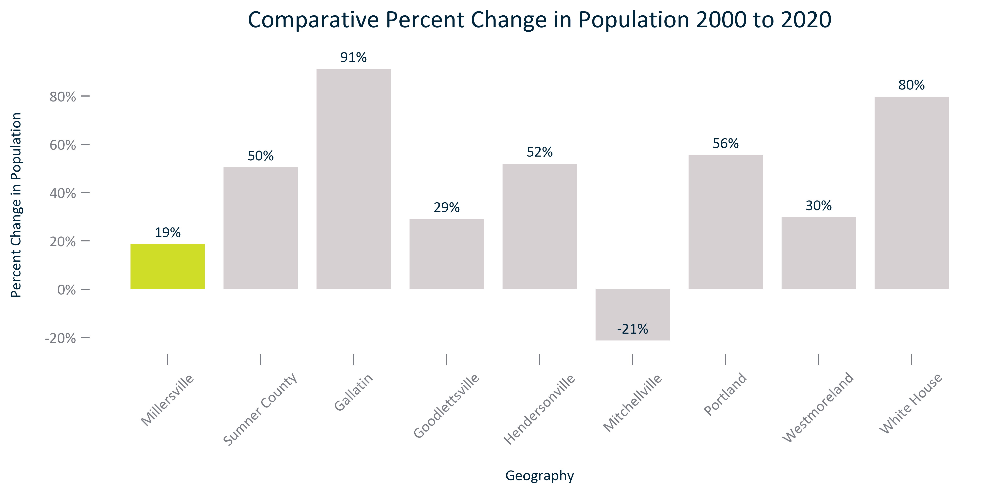

In [24]:
title = 'Comparative Percent Change in Population 2000 to 2020'
df_temp = reggeos
df_temp = df_temp.loc[(df_temp['Time Frame'] == '2000-2020')].sort_values(by = 'NAME', ascending = True).set_index('NAME')
newcols = list(df_temp.index)
newcols.remove(primarygeo)
newcols.remove(county)
newcols = [county] + newcols
newcols = [primarygeo] + newcols
df_temp = df_temp.reindex(newcols).reset_index(drop = False)
x = df_temp['NAME']
y = df_temp['Population % Change']
xlabel = 'Geography'
ylabel = 'Percent Change in Population'
#initiate figure and set parameters
fig, ax = plt.subplots()
bar_color = [C2 if i != primarygeo else C1 for i in x]
ax.bar(x, y, color = bar_color) 
ax.set(title = title, xlabel = xlabel, ylabel = ylabel) #set the title and axes labels
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter(percentnodecimalformat)) #y axis formatting
ax.tick_params(axis = 'x', which = 'major', rotation = 45) #set 
#data labels
singledatalabels(0, 5, "{:,.0f}%")
#display and save
fig.savefig('../Figures/POP_bar_geocomparative_populationchange_overtime.svg', bbox_inches='tight')
fig.savefig('../Figures/POP_bar_geocomparative_populationchange_overtime.png', bbox_inches='tight')
with open('../Figures/POP_bar_geocomparative_populationchange_overtime.txt', 'w') as text_file:
    text_file.write('Citation: 2000 and 2020 Decennial Census')
plt.show()
plt.close();

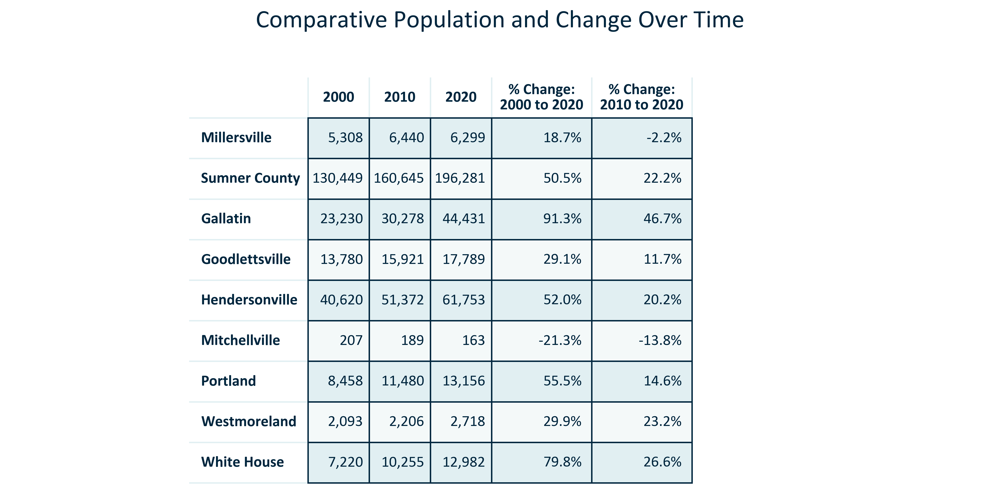

In [25]:
#POP_TABLE
#REGULAR GEOGRAPHIES, POPULATION OVER TIME, % CHANGE BETWEEN FIRST AND LAST YEAR/SECOND AND LAST YEAR
title = 'Comparative Population and Change Over Time'
#set up temporary dataframe
df_temp = reggeost
df_temp = df_temp.sort_values(by = 'NAME', ascending = True).set_index('NAME')
newcols = list(df_temp.index)
newcols.remove(primarygeo)
newcols.remove(county)
newcols = [county] + newcols
newcols = [primarygeo] + newcols
df_temp = df_temp.reindex(newcols)#.reset_index(drop = False)
df_temp = df_temp[['Population 2000', 'Population 2010', 'Population 2020']]
df_temp['% Change:\n2000 to 2020'] = prettypercentchange(df_temp['Population 2020'], df_temp['Population 2000'])
df_temp['% Change:\n2010 to 2020'] = prettypercentchange(df_temp['Population 2020'], df_temp['Population 2010'])
df_temp.update(df_temp[['Population 2000', 'Population 2010', 'Population 2020']].applymap('{:,.0f}'.format))
df_temp = df_temp.rename(columns = {'Population 2000': '  2000  ', 'Population 2010': '  2010  ', 'Population 2020': '  2020  '})
df_temp = df_temp.replace({'nan%':'-', 'inf%':'-'})

#set up table
indexlength = len(df_temp.index)
width = len(df_temp.columns)
colours = tablecolors(indexlength, width)
colcolours = howwide(width)
rowcolours = howlong(indexlength)
#initiate figure and hide axes
fig, ax = plt.subplots()
makeinvisible(guy1, guy2, guy3)
#initiate table and set parameters
table = ax.table(cellText = df_temp.values, colLabels = df_temp.columns, rowLabels = df_temp.index, loc = 'center', 
                 cellColours = colours, colColours = colcolours, cellLoc = 'right', rowLoc = 'left', rowColours = rowcolours)
ax.set_title(label = title, y = 1.1)
row_headers = df_temp.index
column_headers = df_temp.columns
allheaders(col1, col2, edge1, edge2)
table.scale(2, 2.5)
table.auto_set_column_width(col=list(range(len(df_temp.columns))))
#display and save
fig.savefig('../Figures/POP_table_geocomparative_population_overtime.svg', bbox_inches='tight')
fig.savefig('../Figures/POP_table_geocomparative_population_overtime.png', bbox_inches='tight')
with open('../Figures/POP_table_geocomparative_population_overtime.txt', 'w') as text_file:
    text_file.write('Citation: 2000, 2010, and 2020 Decennial Census')
plt.show()
plt.close();

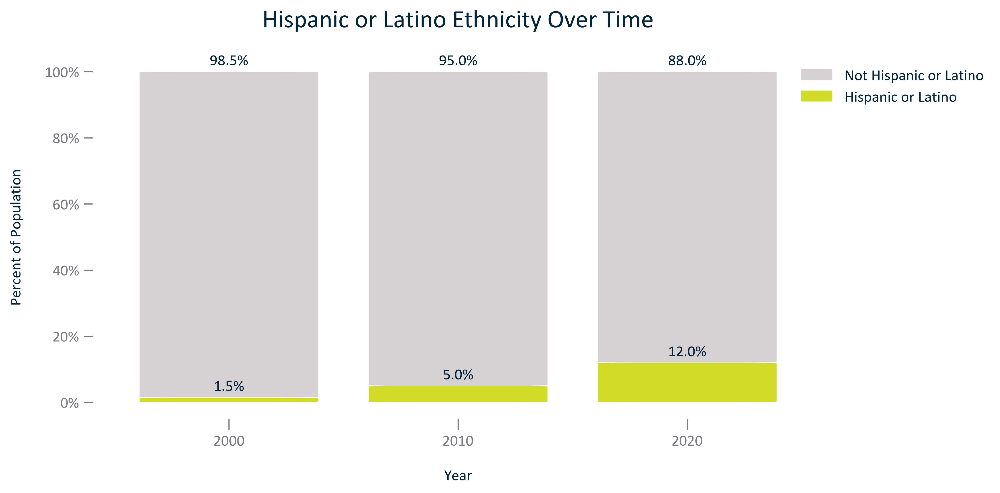

In [26]:
title = 'Hispanic or Latino Ethnicity Over Time'
df_temp = Primary
df_temp = df_temp.loc[df_temp['Year'] != 0.0]
df_temp = df_temp[['Year','Hispanic or Latino %', 'Not Hispanic or Latino %']]
df_temp.update(df_temp[['Year']].applymap('{:.0f}'.format))
df_temp = df_temp.rename(columns = {'Hispanic or Latino %':'Hispanic or Latino', 'Not Hispanic or Latino %':'Not Hispanic or Latino'})
df_temp = df_temp.set_index('Year')
df_temp
#figure
fig, ax = plt.subplots()
w = 0.9
bottom = np.zeros(len(df_temp))
for i, col in enumerate(df_temp.columns):
    ax.bar(df_temp.index, df_temp[col], w, bottom=bottom, label=col)
    bottom += np.array(df_temp[col])
#rounded boxes
roundedboxes(boxstyleinput)
#plt.locator_params(axis='x', nbins = 4)
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter(percentnodecimalformat)) #y axis formatting
ax.set(title = title, xlabel = 'Year', ylabel = 'Percent of Population') #set the title and axes labels
#outside legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[::-1], labels[::-1], loc='upper left', bbox_to_anchor=(0.95, 1), frameon = False)
y_offset = 2
# For each patch (basically each rectangle within the bar), add a label.
stackedbarlabels(abovestackedbarlabels)
#display and save
fig.savefig('../Figures/RACEETH_stackedbar_primarygeo_sharehispanicorlatino_overtime.svg', bbox_inches='tight')
fig.savefig('../Figures/RACEETH_stackedbar_primarygeo_sharehispanicorlatino_overtime.png', bbox_inches='tight')
with open('../Figures/RACEETH_stackedbar_primarygeo_sharehispanicorlatino_overtime.txt', 'w') as text_file:
    text_file.write('Citation: 2000, 2010, and 2020 Decennial Census')
plt.show()
plt.close();

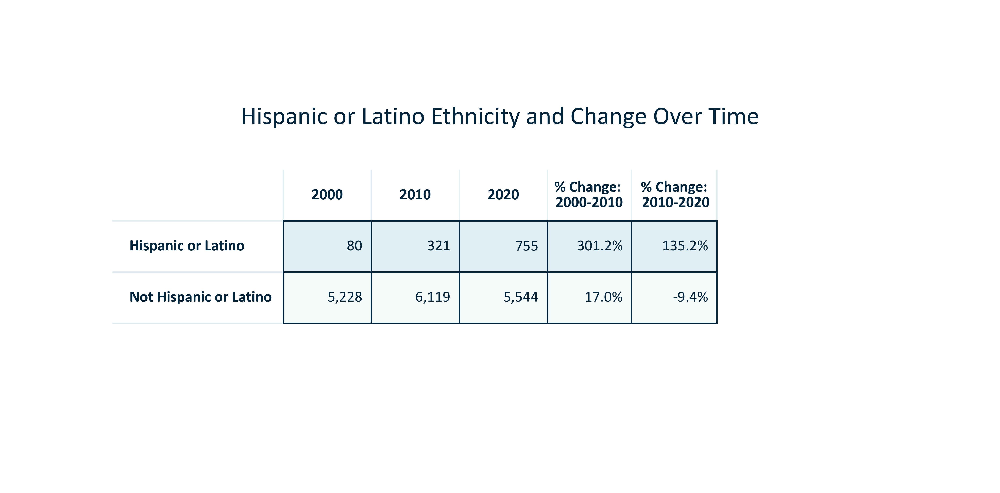

In [27]:
title = 'Hispanic or Latino Ethnicity and Change Over Time'
df_temp = Primary
df_temp1 = df_temp.loc[df_temp['Year'] != 0.0]
df_temp2 = df_temp.loc[df_temp['Time Frame'] == '2000-2010']
df_temp3 = df_temp.loc[df_temp['Time Frame'] == '2010-2020']
df_temp1 = df_temp1[['Year', 'Hispanic or Latino', 'Not Hispanic or Latino']]
df_temp1.update(df_temp1[['Hispanic or Latino', 'Not Hispanic or Latino']].applymap('{:,.0f}'.format))
df_temp1.update(df_temp1[['Year']].applymap('{:.0f}'.format))
df_temp1 = df_temp1.set_index('Year')
df_temp1 = df_temp1.transpose().reset_index()
df_temp2 = df_temp2[['Time Frame', 'Hispanic or Latino % Change', 'Not Hispanic or Latino % Change']]
df_temp2.update(df_temp2[['Hispanic or Latino % Change', 'Not Hispanic or Latino % Change']].applymap('{:,.1f}%'.format))
df_temp2 = df_temp2.set_index('Time Frame')
df_temp2 = df_temp2.transpose().reset_index()
extracted_col = df_temp2['2000-2010']
df_temp1.insert(4, '% Change: \n2000-2010', extracted_col)
df_temp3 = df_temp3[['Time Frame', 'Hispanic or Latino % Change', 'Not Hispanic or Latino % Change']]
df_temp3.update(df_temp3[['Hispanic or Latino % Change', 'Not Hispanic or Latino % Change']].applymap('{:,.1f}%'.format))
df_temp3 = df_temp3.set_index('Time Frame')
df_temp3 = df_temp3.transpose().reset_index()
extracted_col = df_temp3['2010-2020']
df_temp1.insert(5, '% Change:\n 2010-2020', extracted_col)
df_temp = df_temp1.set_index('index')
#df_temp.update(df_temp[['% Change:\n 2010-2020']].applymap('{:,.1f}%'.format))
df_temp = df_temp.rename(columns = {'2000':'      2000      ', '2010':'      2010      ', '2020':'      2020      '})
df_temp = df_temp.replace({'nan%':'-', 'inf%':'-'})
#set up table
indexlength = len(df_temp.index)
width = len(df_temp.columns)
colours = tablecolors(indexlength, width)
colcolours = howwide(width)
rowcolours = howlong(indexlength)
#initiate figure and hide axes
fig, ax = plt.subplots()
fig.patch.set_visible(False)
ax.axis('off')
ax.axis('tight')
#initiate table and set parameters
table = ax.table(cellText = df_temp.values, colLabels = df_temp.columns, rowLabels = df_temp.index, loc = 'center', cellColours = colours, colColours = colcolours, 
                cellLoc = 'right', rowLoc = 'left', rowColours = rowcolours)
table.auto_set_column_width(col=list(range(len(df_temp.columns))))
ax.set_title(label = title, y = 0.7)
row_headers = df_temp.index
column_headers = df_temp.columns
table.scale(2, 2.5) #table scaling
allheaders(col1, col2, edge1, edge2)
#display and save
fig.savefig('../Figures/RACEETH_table_primarygeo_hispaniclatinoethnicityandchange_overtime.svg', bbox_inches='tight')
fig.savefig('../Figures/RACEETH_table_primarygeo_hispaniclatinoethnicityandchange_overtime.png', bbox_inches='tight')
with open('../Figures/RACEETH_table_primarygeo_hispaniclatinoethnicityandchange_overtime.txt', 'w') as text_file:
    text_file.write('Citation: 2000, 2010, and 2020 Decennial Census')
plt.show()
plt.close();

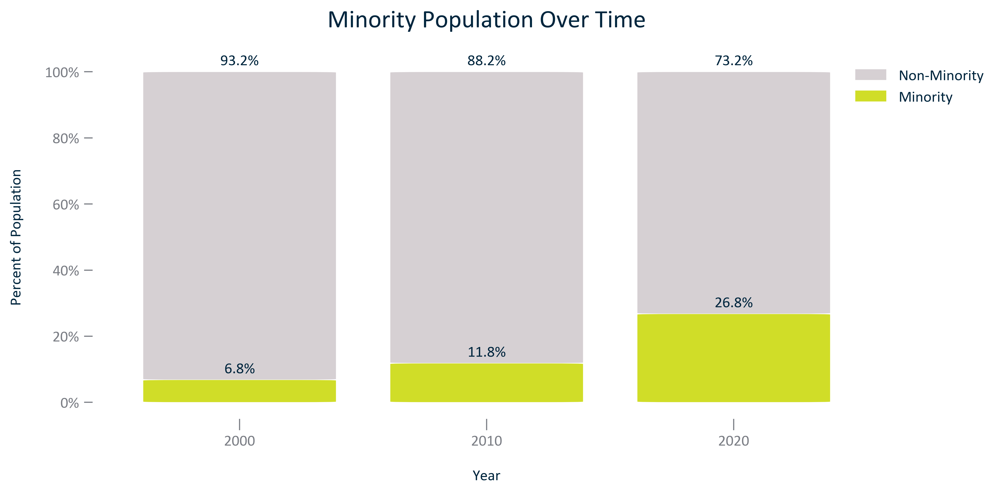

In [28]:
title = 'Minority Population Over Time'
df_temp = Primary.loc[Primary['Year'] != 0.0]
df_temp = df_temp[['Year','Minority %', 'White Alone Not Hispanic or Latino %']]
df_temp = df_temp.rename(columns = {'Minority %': 'Minority', 'White Alone Not Hispanic or Latino %': 'Non-Minority'})
df_temp.update(df_temp[['Year']].applymap('{:.0f}'.format))
df_temp = df_temp.set_index('Year')
#figure
fig, ax = plt.subplots()
w = 0.9
bottom = np.zeros(len(df_temp))
for i, col in enumerate(df_temp.columns):
    ax.bar(df_temp.index, df_temp[col], w, bottom=bottom, label=col)
    bottom += np.array(df_temp[col])
#rounded boxes
roundedboxes(boxstyleinput)
#plt.locator_params(axis='x', nbins = 4)
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter(percentnodecimalformat)) #y axis formatting
ax.set(title = title, xlabel = 'Year', ylabel = 'Percent of Population') #set the title and axes labels
#outside legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[::-1], labels[::-1], loc='upper left', bbox_to_anchor=(0.95, 1), frameon = False)
# For each patch (basically each rectangle within the bar), add a label.
stackedbarlabels(abovestackedbarlabels)
#display and save
fig.savefig('../Figures/RACEETH_stackedbar_primarygeo_minoritystatus_overtime.svg', bbox_inches='tight')
fig.savefig('../Figures/RACEETH_stackedbar_primarygeo_minoritystatus_overtime.png', bbox_inches='tight')
with open('../Figures/RACEETH_stackedbar_primarygeo_minoritystatus_overtime.txt', 'w') as text_file:
    text_file.write('Citation: 2000, 2010, and 2020 Decennial Census')
plt.show()
plt.close();

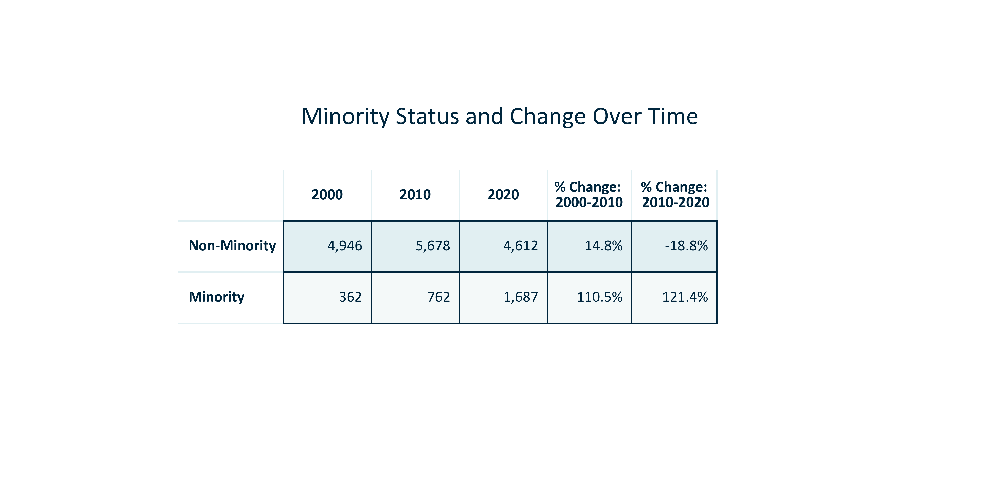

In [29]:
title = 'Minority Status and Change Over Time'
df_temp = Primary
df_temp1 = df_temp.loc[df_temp['Year'] != 0.0]
df_temp2 = df_temp.loc[df_temp['Time Frame'] == '2000-2010']
df_temp3 = df_temp.loc[df_temp['Time Frame'] == '2010-2020']
df_temp1 = df_temp1[['Year', 'White Alone Not Hispanic or Latino', 'Minority']]
df_temp1.update(df_temp1[['White Alone Not Hispanic or Latino', 'Minority']].applymap('{:,.0f}'.format))
df_temp1.update(df_temp1[['Year']].applymap('{:.0f}'.format))
df_temp1 = df_temp1.set_index('Year')
df_temp1 = df_temp1.rename(columns = {'White Alone Not Hispanic or Latino':'Non-Minority'}) 
df_temp1 = df_temp1.transpose().reset_index()
df_temp2 = df_temp2[['Time Frame', 'White Alone Not Hispanic or Latino % Change', 'Minority % Change']]
df_temp2.update(df_temp2[['White Alone Not Hispanic or Latino % Change', 'Minority % Change']].applymap('{:,.1f}%'.format))
df_temp2 = df_temp2.set_index('Time Frame')
df_temp2 = df_temp2.transpose().reset_index()
extracted_col = df_temp2['2000-2010']
df_temp1.insert(4, '% Change: \n2000-2010', extracted_col)
df_temp3 = df_temp3[['Time Frame', 'White Alone Not Hispanic or Latino % Change', 'Minority % Change']]
df_temp3.update(df_temp3[['White Alone Not Hispanic or Latino % Change', 'Minority % Change']].applymap('{:,.1f}%'.format))
df_temp3 = df_temp3.set_index('Time Frame')
df_temp3 = df_temp3.transpose().reset_index()
extracted_col = df_temp3['2010-2020']
df_temp1.insert(5, '% Change:\n 2010-2020', extracted_col)
df_temp = df_temp1.set_index('index')
df_temp = df_temp.rename(columns = {'2000':'      2000      ', '2010':'      2010      ', '2020':'      2020      '})
df_temp = df_temp.replace({'nan%':'-', 'inf%':'-'})
#set up table
indexlength = len(df_temp.index)
width = len(df_temp.columns)
colours = tablecolors(indexlength, width)
colcolours = howwide(width)
rowcolours = howlong(indexlength)
#initiate figure and hide axes
fig, ax = plt.subplots()
fig.patch.set_visible(False)
ax.axis('off')
ax.axis('tight')
#initiate table and set parameters
table = ax.table(cellText = df_temp.values, colLabels = df_temp.columns, rowLabels = df_temp.index, loc = 'center', cellColours = colours, colColours = colcolours, 
                cellLoc = 'right', rowLoc = 'left', rowColours = rowcolours)
table.auto_set_column_width(col=list(range(len(df_temp.columns))))
ax.set_title(label = title, y = 0.7)
row_headers = df_temp.index
column_headers = df_temp.columns
table.scale(2, 2.5) #table scaling
allheaders(col1, col2, edge1, edge2)
#display and save
fig.savefig('../Figures/RACEETH_table_primarygeo_minoritystatusandchange_overtime.svg', bbox_inches='tight')
fig.savefig('../Figures/RACEETH_table_primarygeo_minoritystatusandchange_overtime.png', bbox_inches='tight')
with open('../Figures/RACEETH_table_primarygeo_minoritystatusandchange_overtime.txt', 'w') as text_file:
    text_file.write('Citation: 2000, 2010, and 2020 Decennial Census')
plt.show()
plt.close();

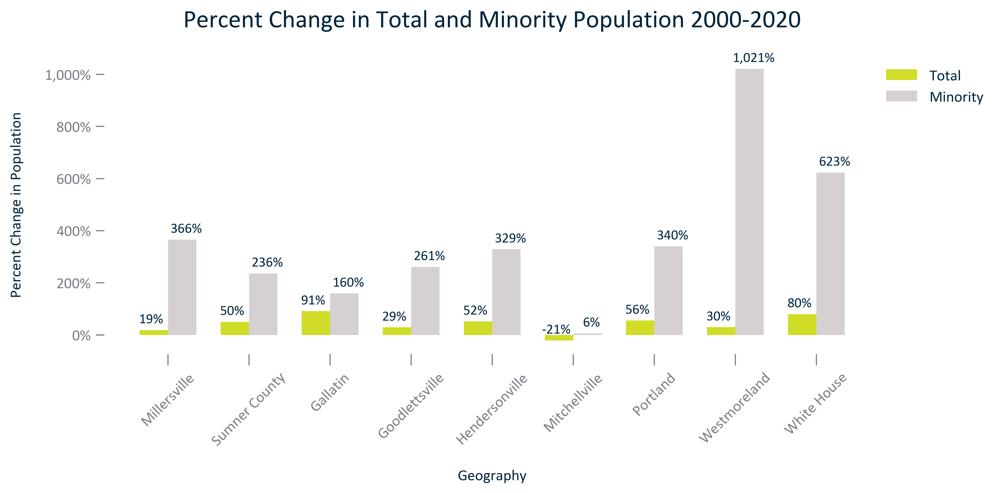

In [30]:
title = 'Percent Change in Total and Minority Population 2000-2020'
df_temp = reggeos
#df_temp = df_temp.loc[(df_temp['NAME'] != 'US')&(df_temp['NAME'] != 'Mitchellville')&(df_temp['NAME'] != 'Millersville')&(df_temp['NAME'] != 'Westmoreland')]
df_temp = df_temp.loc[(df_temp['Time Frame'] == '2000-2020')].sort_values(by = 'NAME', ascending = True).set_index('NAME')
newcols = list(df_temp.index)
newcols.remove(primarygeo)
newcols.remove(county)
newcols = [county] + newcols
newcols = [primarygeo] + newcols
df_temp = df_temp.reindex(newcols)
xpos = np.arange(len(df_temp.index))
x = df_temp.index
y1 = df_temp['Population % Change']
y2 = df_temp['Minority % Change']
xlabel = 'Geography'
ylabel = 'Percent Change in Population'
width = 0.35
fig, ax = plt.subplots()
bar1 = ax.bar(xpos-width/2, y1, width, label = 'Total')
bar2 = ax.bar(xpos+width/2, y2, width, label = 'Minority')

ax.set(title = title, xlabel = xlabel, ylabel = ylabel) #set the title and axes labels
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter(percentnodecimalformat)) #y axis formatting
ax.tick_params(axis = 'x', which = 'major', rotation = 45)
ax.set_xticks(xpos)
ax.set_xticklabels(x)
#outside legend
ax.legend(bbox_to_anchor=(0.99, 1), loc='upper left', frameon = False)
#data labels
#data labels
doubledatalabels(-12, 5, 13, 5, "{:,.0f}%", SMALLER_SIZE)
#display and save
fig.savefig('../Figures/RACEETH_clusterbar_geocomparative_percentchangetotalvsminority_overtime.svg', bbox_inches='tight')
fig.savefig('../Figures/RACEETH_clusterbar_geocomparative_percentchangetotalvsminority_overtime.png', bbox_inches='tight')
with open('../Figures/RACEETH_clusterbar_geocomparative_percentchangetotalvsminority_overtime.txt', 'w') as text_file:
    text_file.write('Citation: 2000 and 2020 Decennial Census')
plt.show()
plt.close();

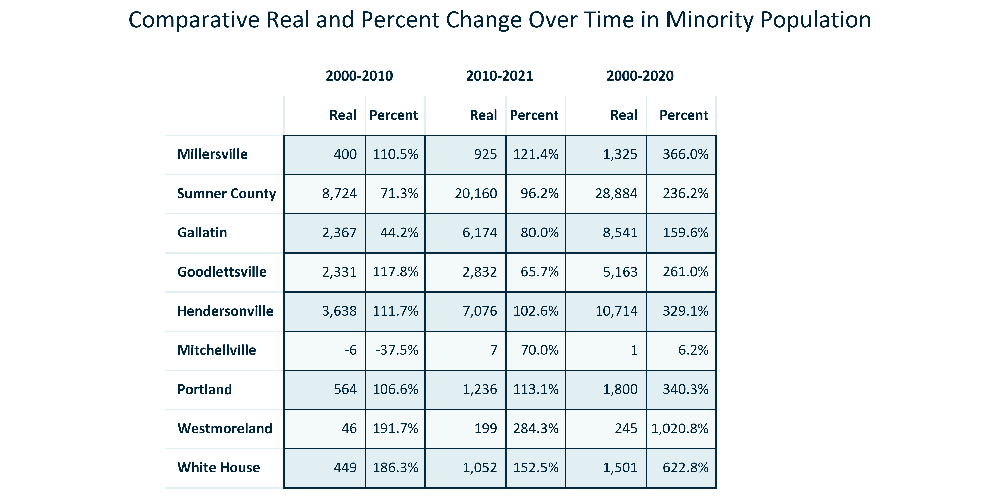

In [31]:
title = 'Comparative Real and Percent Change Over Time in Minority Population'
df_temp = reggeos
df_temp1 = df_temp.sort_values(by = 'NAME')
df_temp1 = df_temp1.loc[df_temp1['Time Frame'] == '2000-2010'].set_index('NAME')
df_temp1 = df_temp1[['Minority Change', 'Minority % Change']]
df_temp1.update(df_temp1[['Minority % Change']].applymap('{:,.1f}%'.format))
df_temp1.update(df_temp1[['Minority Change']].applymap('{:,.0f}'.format))
df_temp1 = df_temp1.rename(columns = {'Minority % Change':'Percent0010', 
                                    'Minority Change':'Number0010'})
df_temp2 = df_temp.sort_values(by = 'NAME')
df_temp2 = df_temp2.loc[df_temp2['Time Frame'] == '2010-2020'].set_index('NAME')
df_temp2 = df_temp2[['Minority Change', 'Minority % Change']]
df_temp2.update(df_temp2[['Minority % Change']].applymap('{:,.1f}%'.format))
df_temp2.update(df_temp2[['Minority Change']].applymap('{:,.0f}'.format))
df_temp2 = df_temp2.rename(columns = {'Minority % Change':'Percent1020', 
                                    'Minority Change':'Number1020'})
df_temp3 = df_temp.sort_values(by = 'NAME')
df_temp3 = df_temp3.loc[df_temp3['Time Frame'] == '2000-2020'].set_index('NAME')
df_temp3 = df_temp3[['Minority Change', 'Minority % Change']]
df_temp3.update(df_temp3[['Minority % Change']].applymap('{:,.1f}%'.format))
df_temp3.update(df_temp3[['Minority Change']].applymap('{:,.0f}'.format))
df_temp3 = df_temp3.rename(columns = {'Minority % Change':'Percent0020', 
                                    'Minority Change':'Number0020'})
dfs = [df_temp2, df_temp3]
df_temp = pd.concat([df_temp1, df_temp2], axis = 1)
df_temp = pd.concat([df_temp, df_temp3], axis = 1)
newcols = list(df_temp.index)
newcols.remove(primarygeo)
newcols.remove(county)
newcols = [county] + newcols
newcols = [primarygeo] + newcols
df_temp = df_temp.reindex(newcols)
df_temp = df_temp.replace({'nan%':'-', 'inf%':'-'})
#set up table
indexlength = len(df_temp.index)
width = len(df_temp.columns)
#index length + 2 for merge column table
colours = tablecolors((indexlength + 2), width)
colcolours = howwide(width)
rowcolours = howlong(indexlength)
#initiate figure and hide axes
fig, ax = plt.subplots()
fig.patch.set_visible(False)
ax.axis('off')
ax.axis('tight')
#2000-2010, 2010-2021, 2000-2021
col_names = ['Real', 'Percent', 'Real', 'Percent', 'Real', 'Percent']
row_headers = df_temp.index
rowstemp = row_headers.insert(0, '')
rowsformerged = rowstemp.insert(0, '')
colstomerge = ['2000-2010','', '2010-2021', '', '2000-2020', '']
doublecols = np.vstack([colstomerge, col_names])
tabletext=np.vstack([colstomerge, col_names, df_temp.values])
#initiate table and set parameters
table = ax.table(cellText=tabletext, rowLabels = rowsformerged, loc = 'center', cellColours = colours, 
                 colColours = colcolours, cellLoc = 'right', rowLoc = 'left', colLoc = 'left', rowColours = rowcolours)
#draw canvas and merge cells
fig.canvas.draw()
mergecells(table, (0,2), (0,3))
mergecells(table, (0,0), (0,1))
mergecells(table, (0,4), (0,5))
table.auto_set_column_width(col=list(range(len(df_temp.columns))))
ax.set_title(label = title, y = 1.1)
column_headers = colstomerge
allheadersmerged(col1, col2, edge1, edge2)
table.scale(2, 2.5) #table scaling
#display and save
#fig.savefig('../Figures/RACEETH_table_geocomparative_allchangeminority_overtime.svg', bbox_inches='tight')
fig.savefig('../Figures/RACEETH_table_geocomparative_allchangeminority_overtime.png', bbox_inches='tight')
with open('../Figures/RACEETH_table_geocomparative_allchangeminority_overtime.txt', 'w') as text_file:
    text_file.write('Citation: 2000, 2010, and 2020 Decennial Census')
plt.show()
plt.close();

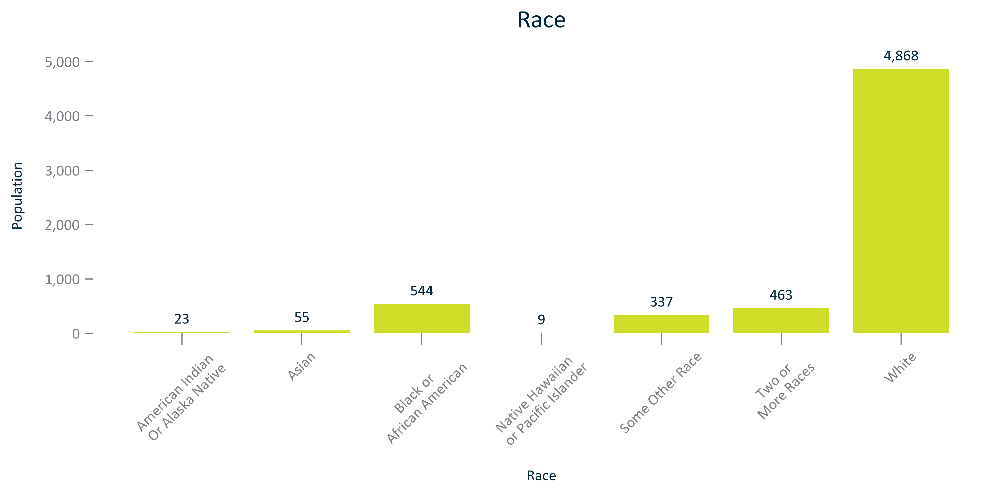

In [32]:
title = 'Race'
df_temp = Primary.loc[Primary['Year'] == 2020.0]
df_temp = df_temp[['White Alone', 'Black or African American Alone', 'American Indian Alaska Native Alone', 'Asian Alone', 
                   'Native Hawaiian Other Pacific Islander Alone', 'Some Other Race Alone', 'Two or More Races']]
df_temp = df_temp.rename(columns = {'White Alone': 'White', 'Black or African American Alone':'Black or \nAfrican American', 
                                    'American Indian Alaska Native Alone': 'American Indian \nOr Alaska Native', 'Asian Alone': 'Asian', 
                                    'Native Hawaiian Other Pacific Islander Alone': 'Native Hawaiian \nor Pacific Islander', 
                                    'Some Other Race Alone': 'Some Other Race', 'Two or More Races': 'Two or \nMore Races'})
df_temp = df_temp.melt(var_name = 'Race', value_name = 'Population')
df_temp = df_temp.sort_values(by = 'Race', ascending = True)
                        
x = df_temp['Race']
y = df_temp['Population']
xlabel = 'Race'
ylabel = 'Population'
#initiate figure and set parameters
fig, ax = plt.subplots()
ax.bar(x, y) 
ax.set(title = title, xlabel = xlabel, ylabel = ylabel) #set the title and axes labels
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter(numbernodecimalformat)) #y axis formatting
ax.tick_params(axis = 'x', which = 'major', rotation = 45)
#data labels
singledatalabels(0, 6, "{:,.0f}")
#display and save
fig.savefig('../Figures/RACEETH_bar_primarygeo_numberrace_2020.svg', bbox_inches='tight')
fig.savefig('../Figures/RACEETH_bar_primarygeo_numberrace_2020.png', bbox_inches='tight')
with open('../Figures/RACEETH_bar_primarygeo_numberrace_2020.txt', 'w') as text_file:
    text_file.write('Citation: 2020 Decennial Census')
plt.show()
plt.close();

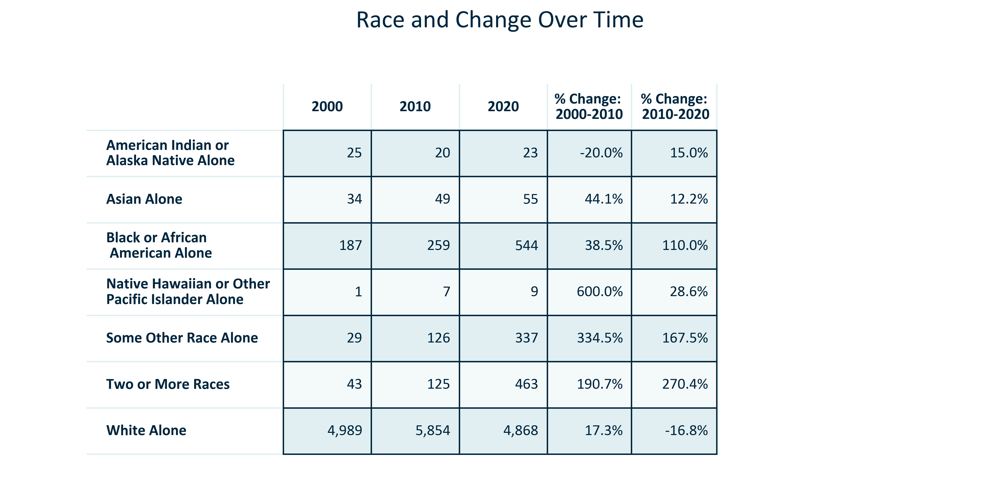

In [33]:
title = 'Race and Change Over Time'
df_temp = Primary
df_temp1 = df_temp.loc[df_temp['Year'] != 0.0]
df_temp2 = df_temp.loc[df_temp['Time Frame'] == '2000-2010']
df_temp3 = df_temp.loc[df_temp['Time Frame'] == '2010-2020']
df_temp1 = df_temp1[['Year', 'White Alone', 'Black or African American Alone', 'American Indian Alaska Native Alone', 'Asian Alone', 
                    'Native Hawaiian Other Pacific Islander Alone', 'Some Other Race Alone', 'Two or More Races']]
df_temp1.update(df_temp1[['White Alone', 'Black or African American Alone', 'American Indian Alaska Native Alone', 'Asian Alone', 
                          'Native Hawaiian Other Pacific Islander Alone', 'Some Other Race Alone', 'Two or More Races']].applymap('{:,.0f}'.format))
df_temp1.update(df_temp1[['Year']].applymap('{:.0f}'.format))
df_temp1 = df_temp1.set_index('Year')
df_temp1 = df_temp1.rename(columns = {'Black or African American Alone':'Black or African\n American Alone', 
                                      'American Indian Alaska Native Alone':'American Indian or\nAlaska Native Alone',
                                      'Native Hawaiian Other Pacific Islander Alone':'Native Hawaiian or Other\nPacific Islander Alone'}) 
                                      #'Some Other Race Alone', 'Two or More Races', 'Hispanic or Latino', 'Not Hispanic or Latino'})
df_temp1 = df_temp1.transpose().reset_index()
df_temp2 = df_temp2[['Time Frame', 'White Alone % Change', 'Black or African American Alone % Change', 
                     'American Indian Alaska Native Alone % Change', 'Asian Alone % Change', 
                     'Native Hawaiian Other Pacific Islander Alone % Change', 'Some Other Race Alone % Change', 
                     'Two or More Races % Change']]
df_temp2.update(df_temp2[['White Alone % Change', 'Black or African American Alone % Change', 
                     'American Indian Alaska Native Alone % Change', 'Asian Alone % Change', 
                     'Native Hawaiian Other Pacific Islander Alone % Change', 'Some Other Race Alone % Change', 
                     'Two or More Races % Change']].applymap('{:,.1f}%'.format))
df_temp2 = df_temp2.set_index('Time Frame')
df_temp2 = df_temp2.transpose().reset_index()
extracted_col = df_temp2['2000-2010']
df_temp1.insert(4, '% Change: \n2000-2010', extracted_col)
df_temp3 = df_temp3[['Time Frame', 'White Alone % Change', 'Black or African American Alone % Change', 
                     'American Indian Alaska Native Alone % Change', 'Asian Alone % Change', 
                     'Native Hawaiian Other Pacific Islander Alone % Change', 'Some Other Race Alone % Change', 
                     'Two or More Races % Change']]
df_temp3.update(df_temp3[['White Alone % Change', 'Black or African American Alone % Change', 
                     'American Indian Alaska Native Alone % Change', 'Asian Alone % Change', 
                     'Native Hawaiian Other Pacific Islander Alone % Change', 'Some Other Race Alone % Change', 
                     'Two or More Races % Change']].applymap('{:,.1f}%'.format))
df_temp3 = df_temp3.set_index('Time Frame')
df_temp3 = df_temp3.transpose().reset_index()
extracted_col = df_temp3['2010-2020']
df_temp1.insert(5, '% Change:\n 2010-2020', extracted_col)
df_temp = df_temp1.sort_values(by = 'index').set_index('index')
df_temp = df_temp.rename(columns = {'2000':'      2000      ', '2010':'      2010      ', '2020':'      2020      '})
df_temp = df_temp.replace({'nan%':'-', 'inf%':'-'})
#set up table
indexlength = len(df_temp.index)
width = len(df_temp.columns)
colours = tablecolors(indexlength, width)
colcolours = howwide(width)
rowcolours = howlong(indexlength)
#initiate figure and hide axes
fig, ax = plt.subplots()
fig.patch.set_visible(False)
ax.axis('off')
ax.axis('tight')
#initiate table and set parameters
table = ax.table(cellText = df_temp.values, colLabels = df_temp.columns, rowLabels = df_temp.index, loc = 'center', cellColours = colours, colColours = colcolours, 
                cellLoc = 'right', rowLoc = 'left', rowColours = rowcolours)
table.auto_set_column_width(col=list(range(len(df_temp.columns))))
ax.set_title(label = title, y = 1)
row_headers = df_temp.index
column_headers = df_temp.columns
table.scale(2, 2.5) #table scaling
allheaders(col1, col2, edge1, edge2)
#display and save
fig.savefig('../Figures/RACEETH_table_primarygeo_raceandchange_overtime.svg', bbox_inches='tight')
fig.savefig('../Figures/RACEETH_table_primarygeo_raceandchange_overtime.png', bbox_inches='tight')
with open('../Figures/RACEETH_table_primarygeo_raceandchange_overtime.txt', 'w') as text_file:
    text_file.write('Citation: 2000, 2010, and 2020 Decennial Census')
plt.show()
plt.close();

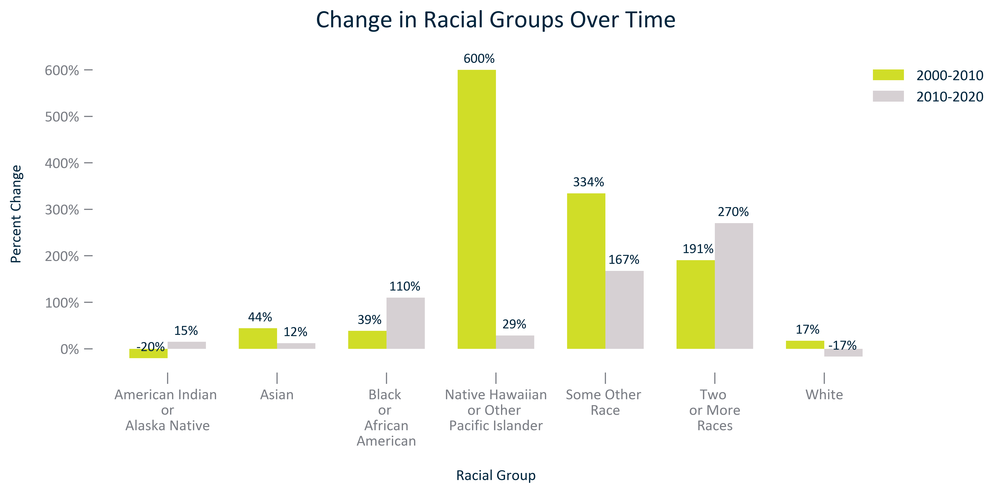

In [34]:
title = 'Change in Racial Groups Over Time'
df_temp = Primary.loc[Primary['Time Frame'] != 'None']
df_temp = df_temp.loc[df_temp['Time Frame'] != '2000-2020']
df_temp = df_temp[['Time Frame','American Indian Alaska Native Alone % Change', 'Asian Alone % Change', 'Black or African American Alone % Change',  
                   'Native Hawaiian Other Pacific Islander Alone % Change', 'Some Other Race Alone % Change', 'Two or More Races % Change', 'White Alone % Change']]
df_temp = df_temp.rename(columns = {'White Alone % Change':'White', 'Black or African American Alone % Change':'Black \nor \nAfrican\nAmerican',
                                    'American Indian Alaska Native Alone % Change':'American Indian \nor\nAlaska Native', 
                                    'Asian Alone % Change':'Asian', 
                                    'Native Hawaiian Other Pacific Islander Alone % Change':'Native Hawaiian\nor Other \nPacific Islander',
                                    'Some Other Race Alone % Change':'Some Other \nRace', 'Two or More Races % Change':'Two \nor More\nRaces'})
df_temp = df_temp.set_index('Time Frame')
df_temp = df_temp.transpose()
#df_temp = df_temp.sort_values(by = '2000-2010', ascending = False)
xlabel = 'Racial Group'
ylabel = 'Percent Change'
#initiate figure and set parameters
xpos = np.arange(len(df_temp.index))
x = df_temp.index
y1 = df_temp['2000-2010']
y2 = df_temp['2010-2020']
width = 0.35
fig, ax = plt.subplots()
bar1 = ax.bar(xpos-width/2, y1, width, label = '2000-2010')
bar2 = ax.bar(xpos+width/2, y2, width, label = '2010-2020')
ax.set(title = title, xlabel = xlabel, ylabel = ylabel) #set the title and axes labels
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter(percentnodecimalformat)) #y axis formatting
ax.set_xticks(xpos)
ax.set_xticklabels(x)
#outside legend
ax.legend(bbox_to_anchor=(0.95, 1), loc='upper left', frameon = False)#, prop = {'size':9})
#data labels
doubledatalabels(-12, 5, 13, 5, "{:,.0f}%", SMALLER_SIZE)
#display and save
fig.savefig('../Figures/RACEETH_clusterbar_primarygeo_changeinracialgroups_overtime.svg', bbox_inches='tight')
fig.savefig('../Figures/RACEETH_clusterbar_primarygeo_changeinracialgroups_overtime.png', bbox_inches='tight')
with open('../Figures/RACEETH_clusterbar_primarygeo_changeinracialgroups_overtime.txt', 'w') as text_file:
    text_file.write('Citation: 2000, 2010, and 2020 Decennial Census')
plt.show()
plt.close();

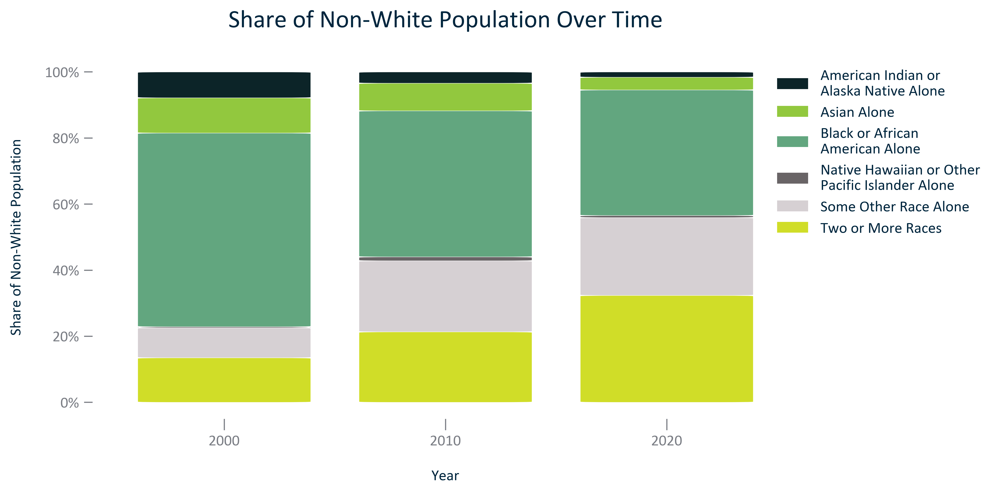

In [35]:
title = 'Share of Non-White Population Over Time'
df_temp = Primary.loc[Primary['Year'] != 0.0]
df_temp = df_temp[['Year','Two or More Races % Non-White Population', 'Some Other Race Alone % Non-White Population', 
                  'Native Hawaiian Other Pacific Islander Alone % Non-White Population', 'Black or African American Alone % Non-White Population', 
                  'Asian Alone % Non-White Population', 'American Indian Alaska Native Alone % Non-White Population'
                  ]]
df_temp.update(df_temp[['Year']].applymap('{:.0f}'.format))
df_temp = df_temp.rename(columns = {'Two or More Races % Non-White Population':'Two or More Races', 
                                    'Some Other Race Alone % Non-White Population':'Some Other Race Alone',
                                    'Native Hawaiian Other Pacific Islander Alone % Non-White Population':'Native Hawaiian or Other \nPacific Islander Alone',
                                    'Black or African American Alone % Non-White Population':'Black or African\nAmerican Alone', 
                                    'Asian Alone % Non-White Population':'Asian Alone',
                                    'American Indian Alaska Native Alone % Non-White Population':'American Indian or\nAlaska Native Alone'})
df_temp = df_temp.set_index('Year')
#figure
fig, ax = plt.subplots()
w = 0.9
bottom = np.zeros(len(df_temp))
for i, col in enumerate(df_temp.columns):
    ax.bar(df_temp.index, df_temp[col], w, bottom=bottom, label=col)
    bottom += np.array(df_temp[col])
#rounded boxes
roundedboxes(boxstyleinput)
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter(percentnodecimalformat)) #y axis formatting
ax.set(title = title, xlabel = 'Year', ylabel = 'Share of Non-White Population') #set the title and axes labels
#outside legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[::-1], labels[::-1], loc='upper left', bbox_to_anchor=(0.95, 1), frameon = False)
y_offset = -6
#display and save
fig.savefig('../Figures/RACEETH_stackedbar_primarygeo_sharenonwhite_overtime.svg', bbox_inches='tight')
fig.savefig('../Figures/RACEETH_stackedbar_primarygeo_sharenonwhite_overtime.png', bbox_inches='tight')
with open('../Figures/RACEETH_stackedbar_primarygeo_sharenonwhite_overtime.txt', 'w') as text_file:
    text_file.write('Citation: 2000, 2010, and 2020 Decennial Census')
plt.show()
plt.close();

C:\Users\jmccall\AppData\Local\Temp\ipykernel_13520\837530372.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp2.append(dfs)


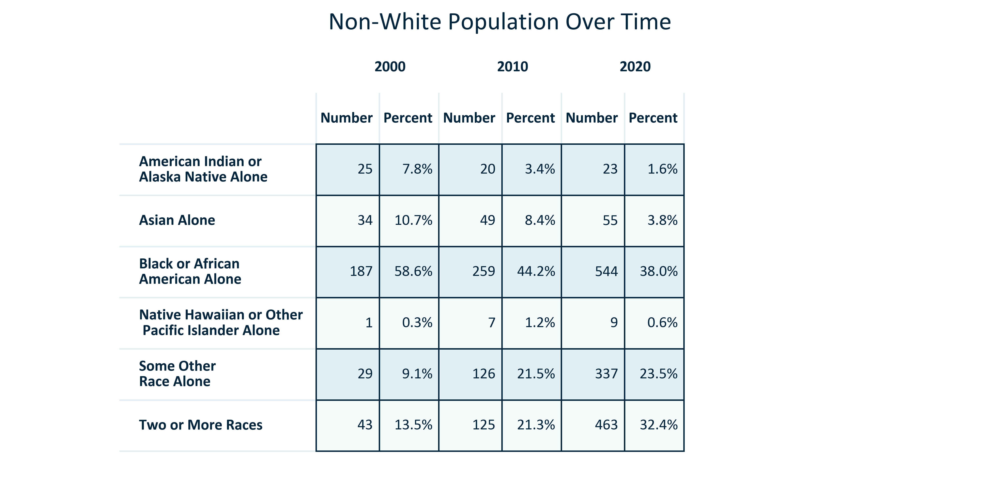

In [36]:
title = 'Non-White Population Over Time'
#set up temporary dataframe
df_temp = Primaryt
next_line = ['Number2000', 'Percent2000', 'Number2010', 'Percent2010', 'Number2020', 'Percent2020']
df_temp1 = df_temp[['Black or African American Alone 2000', 'Black or African American Alone % Non-White Population 2000',
                    'Black or African American Alone 2010', 'Black or African American Alone % Non-White Population 2010',
                    'Black or African American Alone 2020', 'Black or African American Alone % Non-White Population 2020']]
df_temp1.columns = next_line
df_temp2 = df_temp[['American Indian Alaska Native Alone 2000', 'American Indian Alaska Native Alone % Non-White Population 2000',
                   'American Indian Alaska Native Alone 2010', 'American Indian Alaska Native Alone % Non-White Population 2010',
                    'American Indian Alaska Native Alone 2020', 'American Indian Alaska Native Alone % Non-White Population 2020']]
df_temp2.columns = next_line
df_temp3 = df_temp[['Asian Alone 2000', 'Asian Alone % Non-White Population 2000',
                   'Asian Alone 2010', 'Asian Alone % Non-White Population 2010',
                    'Asian Alone 2020', 'Asian Alone % Non-White Population 2020']]
df_temp3.columns = next_line
df_temp4 = df_temp[['Native Hawaiian Other Pacific Islander Alone 2000', 'Native Hawaiian Other Pacific Islander Alone % Non-White Population 2000',
                   'Native Hawaiian Other Pacific Islander Alone 2010', 'Native Hawaiian Other Pacific Islander Alone % Non-White Population 2010',
                    'Native Hawaiian Other Pacific Islander Alone 2020', 'Native Hawaiian Other Pacific Islander Alone % Non-White Population 2020']]
df_temp4.columns = next_line
df_temp5 = df_temp[['Some Other Race Alone 2000', 'Some Other Race Alone % Non-White Population 2000',
                   'Some Other Race Alone 2010', 'Some Other Race Alone % Non-White Population 2010',
                    'Some Other Race Alone 2020', 'Some Other Race Alone % Non-White Population 2020']]
df_temp5.columns = next_line
df_temp6 = df_temp[['Two or More Races 2000', 'Two or More Races % Non-White Population 2000',
                   'Two or More Races 2010', 'Two or More Races % Non-White Population 2010',
                    'Two or More Races 2020', 'Two or More Races % Non-White Population 2020']]
df_temp6.columns = next_line
dfs = [df_temp3, df_temp1, df_temp4, df_temp5, df_temp6]
df_temp = df_temp2.append(dfs)
newindex = ['American Indian or\nAlaska Native Alone', 'Asian Alone', 'Black or African\nAmerican Alone', 'Native Hawaiian or Other\n Pacific Islander Alone', 
             'Some Other\nRace Alone', 'Two or More Races']
df_temp = df_temp.set_axis(newindex)
df_temp.update(df_temp[['Number2000', 'Number2010', 'Number2020']].applymap('{:,.0f}'.format))
df_temp.update(df_temp[['Percent2000', 'Percent2010', 'Percent2020']].applymap('{:.1f}%'.format))
df_temp = df_temp.replace({'nan%':'-', 'inf%':'-'})
#set up table
indexlength = len(df_temp.index)
width = len(df_temp.columns)
#index length + 2 for merge column table
colours = tablecolors((indexlength + 2), width)
colcolours = howwide(width)
rowcolours = howlong(indexlength)
#initiate figure and hide axes
fig, ax = plt.subplots()
fig.patch.set_visible(False)
ax.axis('off')
ax.axis('tight')
#groups
col_names = ['Number', 'Percent', 'Number', 'Percent', 'Number', 'Percent']
row_headers = df_temp.index
rowstemp = row_headers.insert(0, '')
rowsformerged = rowstemp.insert(0, '')
colstomerge = ['2000','', '2010', '', '2020', '']
doublecols = np.vstack([colstomerge, col_names])
tabletext=np.vstack([colstomerge, col_names, df_temp.values])
#initiate table and set parameters
table = ax.table(cellText=tabletext, rowLabels = rowsformerged, loc = 'center', cellColours = colours, 
                 colColours = colcolours, cellLoc = 'right', rowLoc = 'left', colLoc = 'left', rowColours = rowcolours)
#draw canvas and merge cells
fig.canvas.draw()
mergecells(table, (0,2), (0,3))
mergecells(table, (0,0), (0,1))
mergecells(table, (0,4), (0,5))
table.auto_set_column_width(col=list(range(len(df_temp.columns))))
ax.set_title(label = title, y = 0.9)
column_headers = colstomerge
allheadersmerged(col1, col2, edge1, edge2)
table.scale(2, 2.5) #table scaling
#display and save
#fig.savefig('../Figures/RACEETH_table_primarygeo_nonwhite_overtime.svg', bbox_inches='tight')
fig.savefig('../Figures/RACEETH_table_primarygeo_nonwhite_overtime.png', bbox_inches='tight')
with open('../Figures/RACEETH_table_primarygeo_nonwhite_overtime.txt', 'w') as text_file:
    text_file.write('Citation: 2000, 2010, and 2020 Decennial Census')
plt.show()
plt.close();

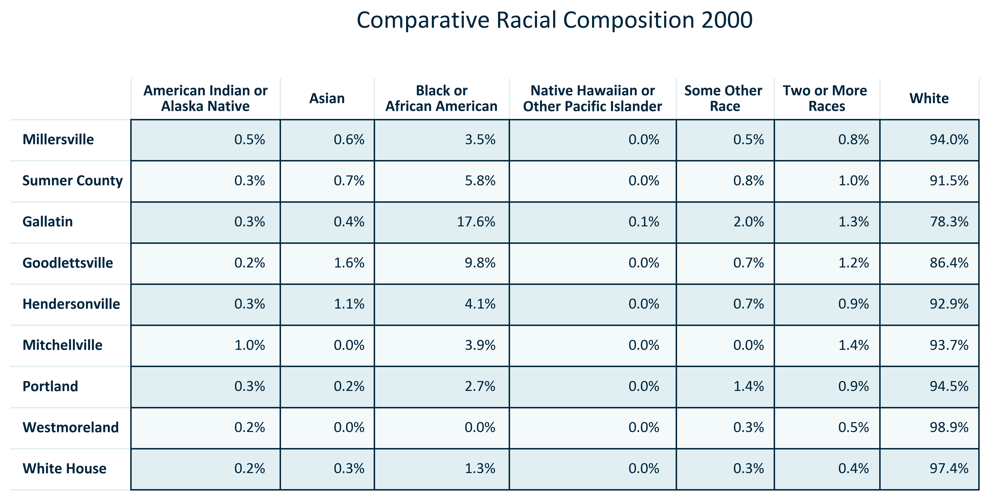

In [37]:
#RACEETH_TABLE
#comparative geos, percent for each racial and ethnic group in 2000
title = 'Comparative Racial Composition 2000'
df_temp = reggeos.loc[reggeos['Year'] == 2000.0]
df_temp = df_temp.sort_values(by = 'NAME').set_index('NAME')
newcols = list(df_temp.index)
newcols.remove(primarygeo)
newcols.remove(county)
newcols = [county] + newcols
newcols = [primarygeo] + newcols
df_temp = df_temp.reindex(newcols)
df_temp = df_temp[['American Indian Alaska Native Alone %', 'Asian Alone %', 'Black or African American Alone %', 
                   'Native Hawaiian Other Pacific Islander Alone %', 'Some Other Race Alone %', 'Two or More Races %', 'White Alone %']]
df_temp.update(df_temp[['American Indian Alaska Native Alone %', 'Asian Alone %', 'Black or African American Alone %', 
                        'Native Hawaiian Other Pacific Islander Alone %', 'Some Other Race Alone %', 'Two or More Races %', 
                        'White Alone %']].applymap('{:,.1f}%'.format))
df_temp = df_temp.rename(columns = {'White Alone %': '      White      ', 'Black or African American Alone %': 'Black or\nAfrican American', 
                                    'American Indian Alaska Native Alone %': 'American Indian or\nAlaska Native', 'Asian Alone %': '      Asian      ', 
                                    'Native Hawaiian Other Pacific Islander Alone %': 'Native Hawaiian or\nOther Pacific Islander', 
                                    'Some Other Race Alone %': 'Some Other \nRace', 'Two or More Races %': 'Two or More \nRaces', 
                                    'Hispanic or Latino %': 'Hispanic or \nLatino'})
df_temp = df_temp.replace({'nan%':'-', 'inf%':'-'})
#set up table
indexlength = len(df_temp.index)
width = len(df_temp.columns)
#index length + 2 for merge column table
colours = tablecolors(indexlength, width)
colcolours = howwide(width)
rowcolours = howlong(indexlength)
#initiate figure and hide axes
fig, ax = plt.subplots()
fig.patch.set_visible(False)
ax.axis('off')
ax.axis('tight')
#initiate table and set parameters
table = ax.table(cellText = df_temp.values, colLabels = df_temp.columns, rowLabels = df_temp.index, loc = 'center', cellColours = colours, colColours = colcolours, 
                cellLoc = 'right', rowLoc = 'left', rowColours = rowcolours)
table.auto_set_column_width(col=list(range(len(df_temp.columns))))
ax.set_title(label = title, y = 1.1)
row_headers = df_temp.index
column_headers = df_temp.columns
table.scale(2.5, 2.5) #table scaling
allheaders(col1, col2, edge1, edge2)
#display and save
fig.savefig('../Figures/RACEETH_table_geocomparative_percentracegroups_2000.svg', bbox_inches='tight')
fig.savefig('../Figures/RACEETH_table_geocomparative_percentracegroups_2000.png', bbox_inches='tight')
with open('../Figures/RACEETH_table_geocomparative_percentracegroups_2000.txt', 'w') as text_file:
    text_file.write('Citation: 2000 Decennial Census')
plt.show()
plt.close();

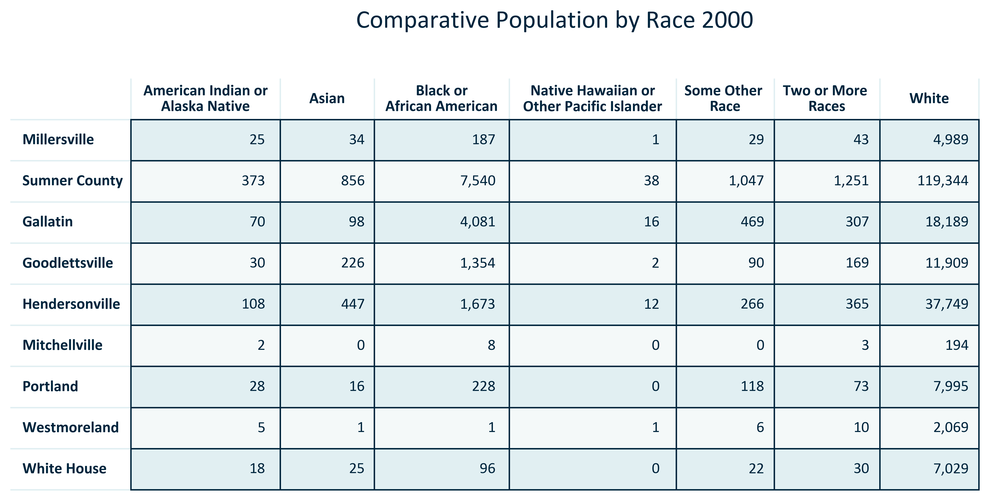

In [38]:
title = 'Comparative Population by Race 2000'
df_temp = reggeos.loc[reggeos['Year'] == 2000.0]
df_temp = df_temp.sort_values(by = 'NAME').set_index('NAME')
newcols = list(df_temp.index)
newcols.remove(primarygeo)
newcols.remove(county)
newcols = [county] + newcols
newcols = [primarygeo] + newcols
df_temp = df_temp.reindex(newcols)
df_temp = df_temp[['American Indian Alaska Native Alone', 'Asian Alone', 'Black or African American Alone', 
                   'Native Hawaiian Other Pacific Islander Alone', 'Some Other Race Alone', 'Two or More Races', 'White Alone']]
df_temp.update(df_temp[['American Indian Alaska Native Alone', 'Asian Alone', 'Black or African American Alone', 
                   'Native Hawaiian Other Pacific Islander Alone', 'Some Other Race Alone', 'Two or More Races', 'White Alone']].applymap('{:,.0f}'.format))
df_temp = df_temp.rename(columns = {'White Alone': '      White      ', 'Black or African American Alone': 'Black or\nAfrican American', 
                                    'American Indian Alaska Native Alone': 'American Indian or\nAlaska Native', 'Asian Alone': '      Asian      ', 
                                    'Native Hawaiian Other Pacific Islander Alone': 'Native Hawaiian or\nOther Pacific Islander', 
                                    'Some Other Race Alone': 'Some Other \nRace', 'Two or More Races': 'Two or More \nRaces', 
                                    'Hispanic or Latino': 'Hispanic or \nLatino'})
df_temp = df_temp.replace({'nan%':'-', 'inf%':'-'})
#set up table
indexlength = len(df_temp.index)
width = len(df_temp.columns)
#index length + 2 for merge column table
colours = tablecolors(indexlength, width)
colcolours = howwide(width)
rowcolours = howlong(indexlength)
#initiate figure and hide axes
fig, ax = plt.subplots()
fig.patch.set_visible(False)
ax.axis('off')
ax.axis('tight')
#initiate table and set parameters
table = ax.table(cellText = df_temp.values, colLabels = df_temp.columns, rowLabels = df_temp.index, loc = 'center', cellColours = colours, colColours = colcolours, 
                cellLoc = 'right', rowLoc = 'left', rowColours = rowcolours)
table.auto_set_column_width(col=list(range(len(df_temp.columns))))
ax.set_title(label = title, y = 1.1)
row_headers = df_temp.index
column_headers = df_temp.columns
table.scale(2.5, 2.5) #table scaling
allheaders(col1, col2, edge1, edge2)
#display and save
fig.savefig('../Figures/RACEETH_table_geocomparative_numberracegroups_2000.svg', bbox_inches='tight')
fig.savefig('../Figures/RACEETH_table_geocomparative_numberracegroups_2000.png', bbox_inches='tight')
with open('../Figures/RACEETH_table_geocomparative_numberracegroups_2000.txt', 'w') as text_file:
    text_file.write('Citation: 2000 Decennial Census')
plt.show()
plt.close();

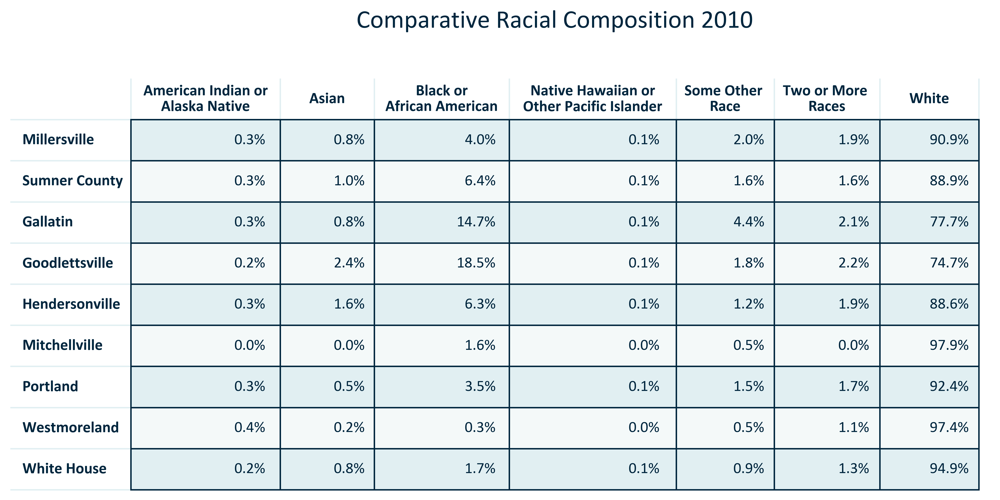

In [39]:
title = 'Comparative Racial Composition 2010'
df_temp = reggeos.loc[reggeos['Year'] == 2010.0]
df_temp = df_temp.sort_values(by = 'NAME').set_index('NAME')
newcols = list(df_temp.index)
newcols.remove(primarygeo)
newcols.remove(county)
newcols = [county] + newcols
newcols = [primarygeo] + newcols
df_temp = df_temp.reindex(newcols)
df_temp = df_temp[['American Indian Alaska Native Alone %', 'Asian Alone %', 'Black or African American Alone %', 
                   'Native Hawaiian Other Pacific Islander Alone %', 'Some Other Race Alone %', 'Two or More Races %', 'White Alone %']]
df_temp.update(df_temp[['American Indian Alaska Native Alone %', 'Asian Alone %', 'Black or African American Alone %', 
                        'Native Hawaiian Other Pacific Islander Alone %', 'Some Other Race Alone %', 'Two or More Races %', 
                        'White Alone %']].applymap('{:,.1f}%'.format))
df_temp = df_temp.rename(columns = {'White Alone %': '      White      ', 'Black or African American Alone %': 'Black or\nAfrican American', 
                                    'American Indian Alaska Native Alone %': 'American Indian or\nAlaska Native', 'Asian Alone %': '      Asian      ', 
                                    'Native Hawaiian Other Pacific Islander Alone %': 'Native Hawaiian or\nOther Pacific Islander', 
                                    'Some Other Race Alone %': 'Some Other \nRace', 'Two or More Races %': 'Two or More \nRaces', 
                                    'Hispanic or Latino %': 'Hispanic or \nLatino'})
df_temp = df_temp.replace({'nan%':'-', 'inf%':'-'})
#set up table
indexlength = len(df_temp.index)
width = len(df_temp.columns)
#index length + 2 for merge column table
colours = tablecolors(indexlength, width)
colcolours = howwide(width)
rowcolours = howlong(indexlength)
#initiate figure and hide axes
fig, ax = plt.subplots()
fig.patch.set_visible(False)
ax.axis('off')
ax.axis('tight')
#initiate table and set parameters
table = ax.table(cellText = df_temp.values, colLabels = df_temp.columns, rowLabels = df_temp.index, loc = 'center', cellColours = colours, colColours = colcolours, 
                cellLoc = 'right', rowLoc = 'left', rowColours = rowcolours)
table.auto_set_column_width(col=list(range(len(df_temp.columns))))
ax.set_title(label = title, y = 1.1)
row_headers = df_temp.index
column_headers = df_temp.columns
table.scale(2.5, 2.5) #table scaling
allheaders(col1, col2, edge1, edge2)
#display and save
fig.savefig('../Figures/RACEETH_table_geocomparative_percentracegroups_2010.svg', bbox_inches='tight')
fig.savefig('../Figures/RACEETH_table_geocomparative_percentracegroups_2010.png', bbox_inches='tight')
with open('../Figures/RACEETH_table_geocomparative_percentracegroups_2010.txt', 'w') as text_file:
    text_file.write('Citation: 2010 Decennial Census')
plt.show()
plt.close();

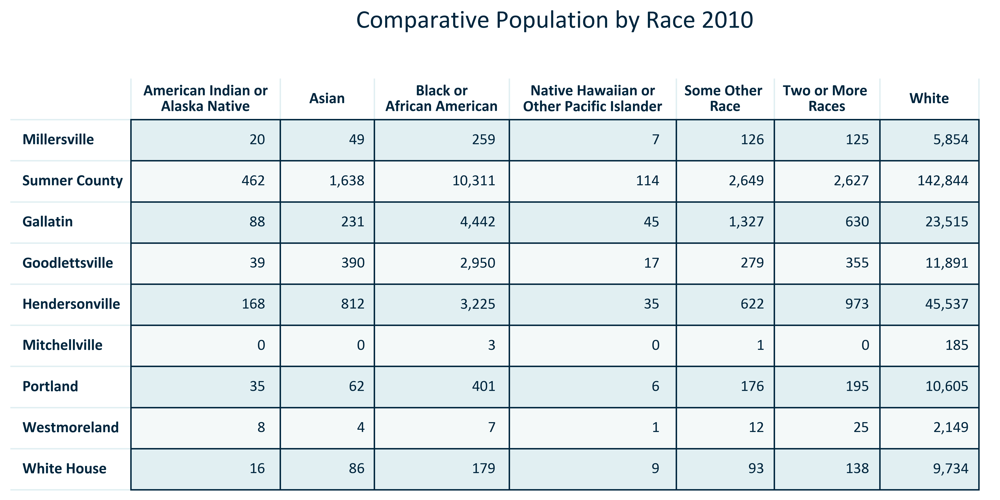

In [40]:
title = 'Comparative Population by Race 2010'
df_temp = reggeos.loc[reggeos['Year'] == 2010.0]
df_temp = df_temp.sort_values(by = 'NAME').set_index('NAME')
newcols = list(df_temp.index)
newcols.remove(primarygeo)
newcols.remove(county)
newcols = [county] + newcols
newcols = [primarygeo] + newcols
df_temp = df_temp.reindex(newcols)
df_temp = df_temp[['American Indian Alaska Native Alone', 'Asian Alone', 'Black or African American Alone', 
                   'Native Hawaiian Other Pacific Islander Alone', 'Some Other Race Alone', 'Two or More Races', 'White Alone']]
df_temp.update(df_temp[['American Indian Alaska Native Alone', 'Asian Alone', 'Black or African American Alone', 
                   'Native Hawaiian Other Pacific Islander Alone', 'Some Other Race Alone', 'Two or More Races', 'White Alone']].applymap('{:,.0f}'.format))
df_temp = df_temp.rename(columns = {'White Alone': '      White      ', 'Black or African American Alone': 'Black or\nAfrican American', 
                                    'American Indian Alaska Native Alone': 'American Indian or\nAlaska Native', 'Asian Alone': '      Asian      ', 
                                    'Native Hawaiian Other Pacific Islander Alone': 'Native Hawaiian or\nOther Pacific Islander', 
                                    'Some Other Race Alone': 'Some Other \nRace', 'Two or More Races': 'Two or More \nRaces', 
                                    'Hispanic or Latino': 'Hispanic or \nLatino'})
df_temp = df_temp.replace({'nan%':'-', 'inf%':'-'})
#set up table
indexlength = len(df_temp.index)
width = len(df_temp.columns)
#index length + 2 for merge column table
colours = tablecolors(indexlength, width)
colcolours = howwide(width)
rowcolours = howlong(indexlength)
#initiate figure and hide axes
fig, ax = plt.subplots()
fig.patch.set_visible(False)
ax.axis('off')
ax.axis('tight')
#initiate table and set parameters
table = ax.table(cellText = df_temp.values, colLabels = df_temp.columns, rowLabels = df_temp.index, loc = 'center', cellColours = colours, colColours = colcolours, 
                cellLoc = 'right', rowLoc = 'left', rowColours = rowcolours)
table.auto_set_column_width(col=list(range(len(df_temp.columns))))
ax.set_title(label = title, y = 1.1)
row_headers = df_temp.index
column_headers = df_temp.columns
table.scale(2.5, 2.5) #table scaling
allheaders(col1, col2, edge1, edge2)
#display and save
fig.savefig('../Figures/RACEETH_table_geocomparative_numberracegroups_2010.svg', bbox_inches='tight')
fig.savefig('../Figures/RACEETH_table_geocomparative_numberracegroups_2010.png', bbox_inches='tight')
with open('../Figures/RACEETH_table_geocomparative_numberracegroups_2010.txt', 'w') as text_file:
    text_file.write('Citation: 2010 Decennial Census')
plt.show()
plt.close();

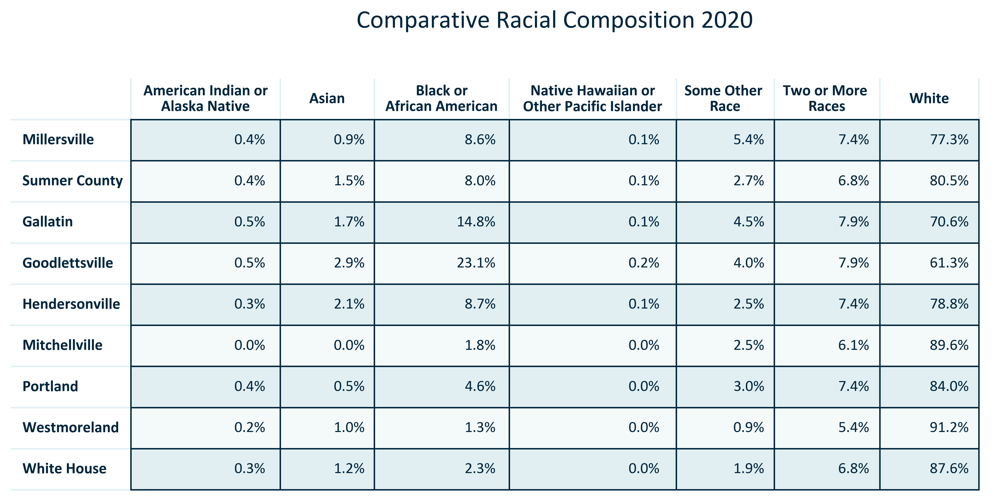

In [41]:
title = 'Comparative Racial Composition 2020'
df_temp = reggeos.loc[reggeos['Year'] == 2020.0]
df_temp = df_temp.sort_values(by = 'NAME').set_index('NAME')
newcols = list(df_temp.index)
newcols.remove(primarygeo)
newcols.remove(county)
newcols = [county] + newcols
newcols = [primarygeo] + newcols
df_temp = df_temp.reindex(newcols)
df_temp = df_temp[['American Indian Alaska Native Alone %', 'Asian Alone %', 'Black or African American Alone %', 
                   'Native Hawaiian Other Pacific Islander Alone %', 'Some Other Race Alone %', 'Two or More Races %', 'White Alone %']]
df_temp.update(df_temp[['American Indian Alaska Native Alone %', 'Asian Alone %', 'Black or African American Alone %', 
                        'Native Hawaiian Other Pacific Islander Alone %', 'Some Other Race Alone %', 'Two or More Races %', 
                        'White Alone %']].applymap('{:,.1f}%'.format))
df_temp = df_temp.rename(columns = {'White Alone %': '      White      ', 'Black or African American Alone %': 'Black or\nAfrican American', 
                                    'American Indian Alaska Native Alone %': 'American Indian or\nAlaska Native', 'Asian Alone %': '      Asian      ', 
                                    'Native Hawaiian Other Pacific Islander Alone %': 'Native Hawaiian or\nOther Pacific Islander', 
                                    'Some Other Race Alone %': 'Some Other \nRace', 'Two or More Races %': 'Two or More \nRaces', 
                                    'Hispanic or Latino %': 'Hispanic or \nLatino'})
df_temp = df_temp.replace({'nan%':'-', 'inf%':'-'})
#set up table
indexlength = len(df_temp.index)
width = len(df_temp.columns)
#index length + 2 for merge column table
colours = tablecolors(indexlength, width)
colcolours = howwide(width)
rowcolours = howlong(indexlength)
#initiate figure and hide axes
fig, ax = plt.subplots()
fig.patch.set_visible(False)
ax.axis('off')
ax.axis('tight')
#initiate table and set parameters
table = ax.table(cellText = df_temp.values, colLabels = df_temp.columns, rowLabels = df_temp.index, loc = 'center', cellColours = colours, colColours = colcolours, 
                cellLoc = 'right', rowLoc = 'left', rowColours = rowcolours)
table.auto_set_column_width(col=list(range(len(df_temp.columns))))
ax.set_title(label = title, y = 1.1)
row_headers = df_temp.index
column_headers = df_temp.columns
table.scale(2.5, 2.5) #table scaling
allheaders(col1, col2, edge1, edge2)
#display and save
fig.savefig('../Figures/RACEETH_table_geocomparative_percentracegroups_2020.svg', bbox_inches='tight')
fig.savefig('../Figures/RACEETH_table_geocomparative_percentracegroups_2020.png', bbox_inches='tight')
with open('../Figures/RACEETH_table_geocomparative_percentracegroups_2020.txt', 'w') as text_file:
    text_file.write('Citation: 2020 Decennial Census')
plt.show()
plt.close();

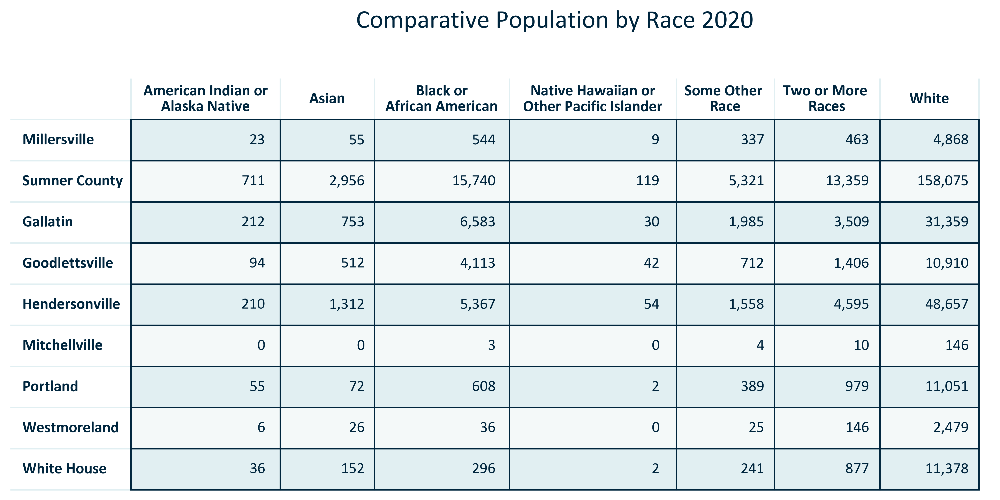

In [42]:
title = 'Comparative Population by Race 2020'
df_temp = reggeos.loc[reggeos['Year'] == 2020.0]
df_temp = df_temp.sort_values(by = 'NAME').set_index('NAME')
newcols = list(df_temp.index)
newcols.remove(primarygeo)
newcols.remove(county)
newcols = [county] + newcols
newcols = [primarygeo] + newcols
df_temp = df_temp.reindex(newcols)
df_temp = df_temp[['American Indian Alaska Native Alone', 'Asian Alone', 'Black or African American Alone', 
                   'Native Hawaiian Other Pacific Islander Alone', 'Some Other Race Alone', 'Two or More Races', 'White Alone']]
df_temp.update(df_temp[['American Indian Alaska Native Alone', 'Asian Alone', 'Black or African American Alone', 
                   'Native Hawaiian Other Pacific Islander Alone', 'Some Other Race Alone', 'Two or More Races', 'White Alone']].applymap('{:,.0f}'.format))
df_temp = df_temp.rename(columns = {'White Alone': '      White      ', 'Black or African American Alone': 'Black or\nAfrican American', 
                                    'American Indian Alaska Native Alone': 'American Indian or\nAlaska Native', 'Asian Alone': '      Asian      ', 
                                    'Native Hawaiian Other Pacific Islander Alone': 'Native Hawaiian or\nOther Pacific Islander', 
                                    'Some Other Race Alone': 'Some Other \nRace', 'Two or More Races': 'Two or More \nRaces', 
                                    'Hispanic or Latino': 'Hispanic or \nLatino'})
df_temp = df_temp.replace({'nan%':'-', 'inf%':'-'})
#set up table
indexlength = len(df_temp.index)
width = len(df_temp.columns)
#index length + 2 for merge column table
colours = tablecolors(indexlength, width)
colcolours = howwide(width)
rowcolours = howlong(indexlength)
#initiate figure and hide axes
fig, ax = plt.subplots()
fig.patch.set_visible(False)
ax.axis('off')
ax.axis('tight')
#initiate table and set parameters
table = ax.table(cellText = df_temp.values, colLabels = df_temp.columns, rowLabels = df_temp.index, loc = 'center', cellColours = colours, colColours = colcolours, 
                cellLoc = 'right', rowLoc = 'left', rowColours = rowcolours)
table.auto_set_column_width(col=list(range(len(df_temp.columns))))
ax.set_title(label = title, y = 1.1)
row_headers = df_temp.index
column_headers = df_temp.columns
table.scale(2.5, 2.5) #table scaling
allheaders(col1, col2, edge1, edge2)
#display and save
fig.savefig('../Figures/RACEETH_table_geocomparative_numberracegroups_2020.svg', bbox_inches='tight')
fig.savefig('../Figures/RACEETH_table_geocomparative_numberracegroups_2020.png', bbox_inches='tight')
with open('../Figures/RACEETH_table_geocomparative_numberracegroups_2020.txt', 'w') as text_file:
    text_file.write('Citation: 2020 Decennial Census')
plt.show()
plt.close();

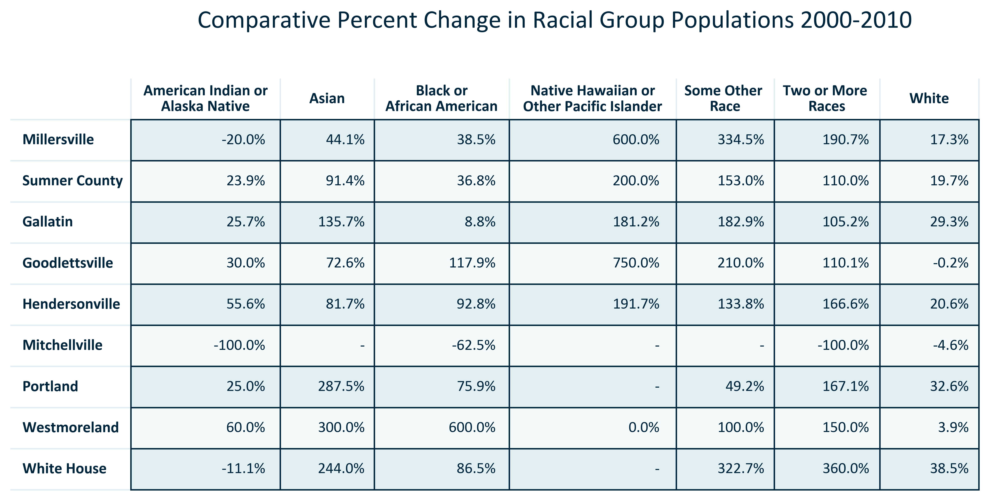

In [43]:
title = 'Comparative Percent Change in Racial Group Populations 2000-2010'
df_temp = reggeos
df_temp = df_temp.loc[df_temp['Time Frame'] == '2000-2010'].sort_values(by = 'NAME').set_index('NAME')
newcols = list(df_temp.index)
newcols.remove(primarygeo)
newcols.remove(county)
newcols = [county] + newcols
newcols = [primarygeo] + newcols
df_temp = df_temp.reindex(newcols)
df_temp = df_temp[['American Indian Alaska Native Alone % Change', 'Asian Alone % Change', 'Black or African American Alone % Change', 
                   'Native Hawaiian Other Pacific Islander Alone % Change','Some Other Race Alone % Change', 'Two or More Races % Change', 'White Alone % Change']]
df_temp.update(df_temp[['American Indian Alaska Native Alone % Change', 'Asian Alone % Change', 'Black or African American Alone % Change', 
                   'Native Hawaiian Other Pacific Islander Alone % Change','Some Other Race Alone % Change', 'Two or More Races % Change', 
                        'White Alone % Change']].applymap('{:,.1f}%'.format))
df_temp = df_temp.rename(columns = {'White Alone % Change': '      White      ', 'Black or African American Alone % Change': 'Black or\nAfrican American', 
                                    'American Indian Alaska Native Alone % Change': 'American Indian or\nAlaska Native', 'Asian Alone % Change': '      Asian      ', 
                                    'Native Hawaiian Other Pacific Islander Alone % Change': 'Native Hawaiian or\nOther Pacific Islander', 
                                    'Some Other Race Alone % Change': 'Some Other \nRace', 'Two or More Races % Change': 'Two or More \nRaces', 
                                    'Hispanic or Latino % Change': 'Hispanic or \nLatino'})
df_temp = df_temp.replace({'nan%':'-', 'inf%':'-'})
#set up table
indexlength = len(df_temp.index)
width = len(df_temp.columns)
#index length + 2 for merge column table
colours = tablecolors(indexlength, width)
colcolours = howwide(width)
rowcolours = howlong(indexlength)
#initiate figure and hide axes
fig, ax = plt.subplots()
fig.patch.set_visible(False)
ax.axis('off')
ax.axis('tight')
#initiate table and set parameters
table = ax.table(cellText = df_temp.values, colLabels = df_temp.columns, rowLabels = df_temp.index, loc = 'center', cellColours = colours, colColours = colcolours, 
                cellLoc = 'right', rowLoc = 'left', rowColours = rowcolours)
table.auto_set_column_width(col=list(range(len(df_temp.columns))))
ax.set_title(label = title, y = 1.1)
row_headers = df_temp.index
column_headers = df_temp.columns
table.scale(2.5, 2.5) #table scaling
allheaders(col1, col2, edge1, edge2)
#display and save
fig.savefig('../Figures/RACEETH_table_geocomparative_percentchangeracegroups_00to10.svg', bbox_inches='tight')
fig.savefig('../Figures/RACEETH_table_geocomparative_percentchangeracegroups_00to10.png', bbox_inches='tight')
with open('../Figures/RACEETH_table_geocomparative_percentchangeracegroups_00to10.txt', 'w') as text_file:
    text_file.write('Citation: 2000 and 2010 Decennial Census')
plt.show()
plt.close();

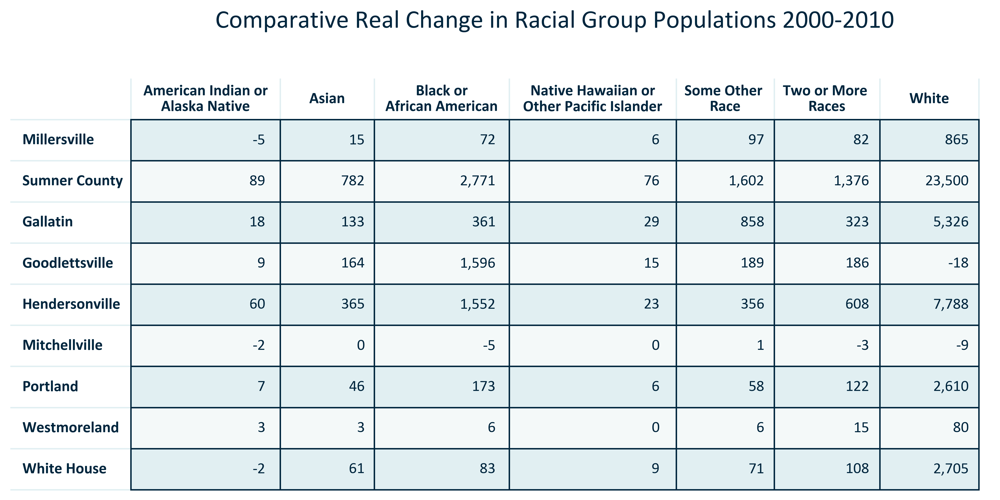

In [44]:
title = 'Comparative Real Change in Racial Group Populations 2000-2010'
df_temp = reggeos
df_temp = df_temp.loc[df_temp['Time Frame'] == '2000-2010'].sort_values(by = 'NAME').set_index('NAME')
newcols = list(df_temp.index)
newcols.remove(primarygeo)
newcols.remove(county)
newcols = [county] + newcols
newcols = [primarygeo] + newcols
df_temp = df_temp.reindex(newcols)
df_temp = df_temp[['American Indian Alaska Native Alone Change', 'Asian Alone Change', 'Black or African American Alone Change', 
                   'Native Hawaiian Other Pacific Islander Alone Change','Some Other Race Alone Change', 'Two or More Races Change', 'White Alone Change']]
df_temp.update(df_temp[['American Indian Alaska Native Alone Change', 'Asian Alone Change', 'Black or African American Alone Change', 
                   'Native Hawaiian Other Pacific Islander Alone Change','Some Other Race Alone Change', 'Two or More Races Change', 
                        'White Alone Change']].applymap('{:,.0f}'.format))
df_temp = df_temp.rename(columns = {'White Alone Change': '      White      ', 'Black or African American Alone Change': 'Black or\nAfrican American', 
                                    'American Indian Alaska Native Alone Change': 'American Indian or\nAlaska Native', 'Asian Alone Change': '      Asian      ', 
                                    'Native Hawaiian Other Pacific Islander Alone Change': 'Native Hawaiian or\nOther Pacific Islander', 
                                    'Some Other Race Alone Change': 'Some Other \nRace', 'Two or More Races Change': 'Two or More \nRaces', 
                                    'Hispanic or Latino Change': 'Hispanic or \nLatino'})
df_temp = df_temp.replace({'nan%':'-', 'inf%':'-'})
#set up table
indexlength = len(df_temp.index)
width = len(df_temp.columns)
#index length + 2 for merge column table
colours = tablecolors(indexlength, width)
colcolours = howwide(width)
rowcolours = howlong(indexlength)
#initiate figure and hide axes
fig, ax = plt.subplots()
fig.patch.set_visible(False)
ax.axis('off')
ax.axis('tight')
#initiate table and set parameters
table = ax.table(cellText = df_temp.values, colLabels = df_temp.columns, rowLabels = df_temp.index, loc = 'center', cellColours = colours, colColours = colcolours, 
                cellLoc = 'right', rowLoc = 'left', rowColours = rowcolours)
table.auto_set_column_width(col=list(range(len(df_temp.columns))))
ax.set_title(label = title, y = 1.1)
row_headers = df_temp.index
column_headers = df_temp.columns
table.scale(2.5, 2.5) #table scaling
allheaders(col1, col2, edge1, edge2)
#display and save
fig.savefig('../Figures/RACEETH_table_geocomparative_realchangeracegroups_00to10.svg', bbox_inches='tight')
fig.savefig('../Figures/RACEETH_table_geocomparative_realchangeracegroups_00to10.png', bbox_inches='tight')
with open('../Figures/RACEETH_table_geocomparative_realchangeracegroups_00to10.txt', 'w') as text_file:
    text_file.write('Citation: 2000 and 2010 Decennial Census')
plt.show()
plt.close();

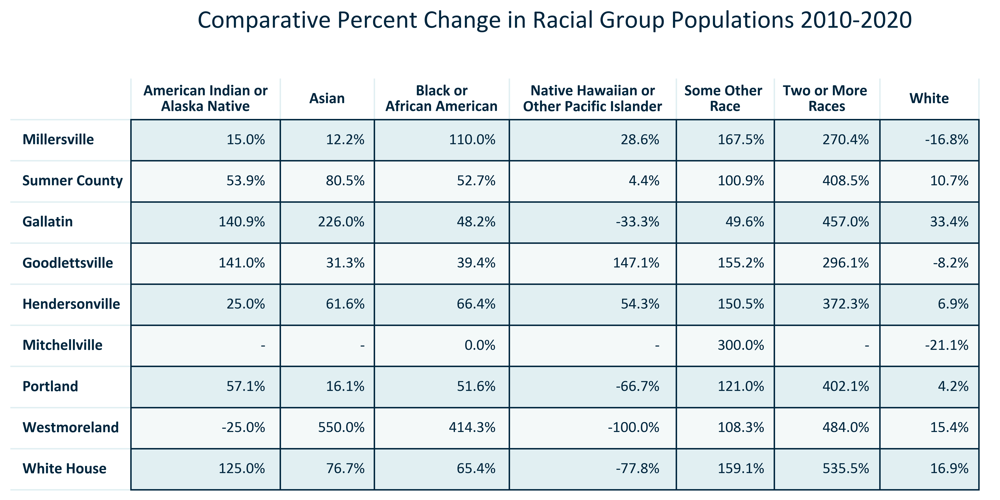

In [45]:
title = 'Comparative Percent Change in Racial Group Populations 2010-2020'
df_temp = reggeos
df_temp = df_temp.loc[df_temp['Time Frame'] == '2010-2020'].sort_values(by = 'NAME').set_index('NAME')
newcols = list(df_temp.index)
newcols.remove(primarygeo)
newcols.remove(county)
newcols = [county] + newcols
newcols = [primarygeo] + newcols
df_temp = df_temp.reindex(newcols)
df_temp = df_temp[['American Indian Alaska Native Alone % Change', 'Asian Alone % Change', 'Black or African American Alone % Change', 
                   'Native Hawaiian Other Pacific Islander Alone % Change','Some Other Race Alone % Change', 'Two or More Races % Change', 'White Alone % Change']]
df_temp.update(df_temp[['American Indian Alaska Native Alone % Change', 'Asian Alone % Change', 'Black or African American Alone % Change', 
                   'Native Hawaiian Other Pacific Islander Alone % Change','Some Other Race Alone % Change', 'Two or More Races % Change', 
                        'White Alone % Change']].applymap('{:,.1f}%'.format))
df_temp = df_temp.rename(columns = {'White Alone % Change': '      White      ', 'Black or African American Alone % Change': 'Black or\nAfrican American', 
                                    'American Indian Alaska Native Alone % Change': 'American Indian or\nAlaska Native', 'Asian Alone % Change': '      Asian      ', 
                                    'Native Hawaiian Other Pacific Islander Alone % Change': 'Native Hawaiian or\nOther Pacific Islander', 
                                    'Some Other Race Alone % Change': 'Some Other \nRace', 'Two or More Races % Change': 'Two or More \nRaces', 
                                    'Hispanic or Latino % Change': 'Hispanic or \nLatino'})
df_temp = df_temp.replace({'nan%':'-', 'inf%':'-'})
#set up table
indexlength = len(df_temp.index)
width = len(df_temp.columns)
#index length + 2 for merge column table
colours = tablecolors(indexlength, width)
colcolours = howwide(width)
rowcolours = howlong(indexlength)
#initiate figure and hide axes
fig, ax = plt.subplots()
fig.patch.set_visible(False)
ax.axis('off')
ax.axis('tight')
#initiate table and set parameters
table = ax.table(cellText = df_temp.values, colLabels = df_temp.columns, rowLabels = df_temp.index, loc = 'center', cellColours = colours, colColours = colcolours, 
                cellLoc = 'right', rowLoc = 'left', rowColours = rowcolours)
table.auto_set_column_width(col=list(range(len(df_temp.columns))))
ax.set_title(label = title, y = 1.1)
row_headers = df_temp.index
column_headers = df_temp.columns
table.scale(2.5, 2.5) #table scaling
allheaders(col1, col2, edge1, edge2)
#display and save
fig.savefig('../Figures/RACEETH_table_geocomparative_percentchangeracegroups_10to20.svg', bbox_inches='tight')
fig.savefig('../Figures/RACEETH_table_geocomparative_percentchangeracegroups_10to20.png', bbox_inches='tight')
with open('../Figures/RACEETH_table_geocomparative_percentchangeracegroups_10to20.txt', 'w') as text_file:
    text_file.write('Citation: 2010 and 2020 Decennial Census')
plt.show()
plt.close();

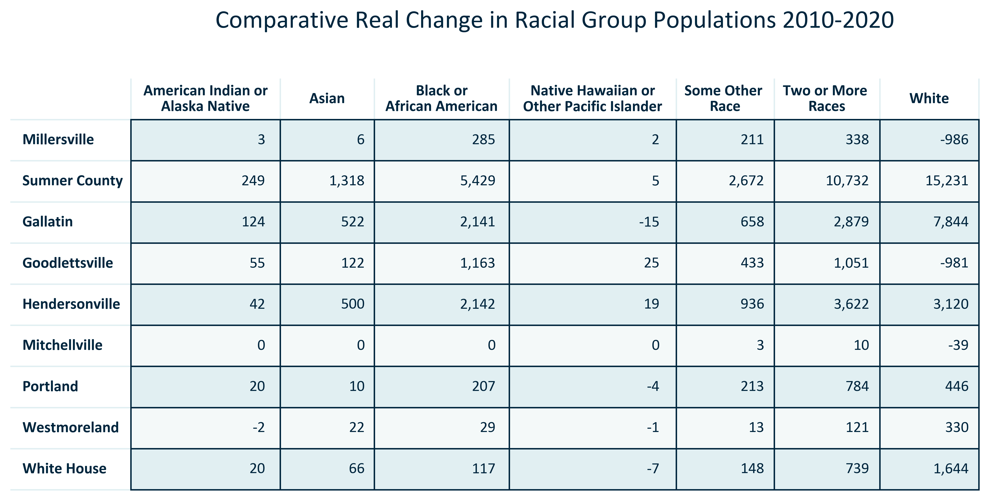

In [46]:
title = 'Comparative Real Change in Racial Group Populations 2010-2020'
df_temp = reggeos
df_temp = df_temp.loc[df_temp['Time Frame'] == '2010-2020'].sort_values(by = 'NAME').set_index('NAME')
newcols = list(df_temp.index)
newcols.remove(primarygeo)
newcols.remove(county)
newcols = [county] + newcols
newcols = [primarygeo] + newcols
df_temp = df_temp.reindex(newcols)
df_temp = df_temp[['American Indian Alaska Native Alone Change', 'Asian Alone Change', 'Black or African American Alone Change', 
                   'Native Hawaiian Other Pacific Islander Alone Change','Some Other Race Alone Change', 'Two or More Races Change', 'White Alone Change']]
df_temp.update(df_temp[['American Indian Alaska Native Alone Change', 'Asian Alone Change', 'Black or African American Alone Change', 
                   'Native Hawaiian Other Pacific Islander Alone Change','Some Other Race Alone Change', 'Two or More Races Change', 
                        'White Alone Change']].applymap('{:,.0f}'.format))
df_temp = df_temp.rename(columns = {'White Alone Change': '      White      ', 'Black or African American Alone Change': 'Black or\nAfrican American', 
                                    'American Indian Alaska Native Alone Change': 'American Indian or\nAlaska Native', 'Asian Alone Change': '      Asian      ', 
                                    'Native Hawaiian Other Pacific Islander Alone Change': 'Native Hawaiian or\nOther Pacific Islander', 
                                    'Some Other Race Alone Change': 'Some Other \nRace', 'Two or More Races Change': 'Two or More \nRaces', 
                                    'Hispanic or Latino Change': 'Hispanic or \nLatino'})
df_temp = df_temp.replace({'nan%':'-', 'inf%':'-'})
#set up table
indexlength = len(df_temp.index)
width = len(df_temp.columns)
#index length + 2 for merge column table
colours = tablecolors(indexlength, width)
colcolours = howwide(width)
rowcolours = howlong(indexlength)
#initiate figure and hide axes
fig, ax = plt.subplots()
fig.patch.set_visible(False)
ax.axis('off')
ax.axis('tight')
#initiate table and set parameters
table = ax.table(cellText = df_temp.values, colLabels = df_temp.columns, rowLabels = df_temp.index, loc = 'center', cellColours = colours, colColours = colcolours, 
                cellLoc = 'right', rowLoc = 'left', rowColours = rowcolours)
table.auto_set_column_width(col=list(range(len(df_temp.columns))))
ax.set_title(label = title, y = 1.1)
row_headers = df_temp.index
column_headers = df_temp.columns
table.scale(2.5, 2.5) #table scaling
allheaders(col1, col2, edge1, edge2)
#display and save
fig.savefig('../Figures/RACEETH_table_geocomparative_realchangeracegroups_10to20.svg', bbox_inches='tight')
fig.savefig('../Figures/RACEETH_table_geocomparative_realchangeracegroups_10to20.png', bbox_inches='tight')
with open('../Figures/RACEETH_table_geocomparative_realchangeracegroups_10to20.txt', 'w') as text_file:
    text_file.write('Citation: 2010 and 2020 Decennial Census')
plt.show()
plt.close();

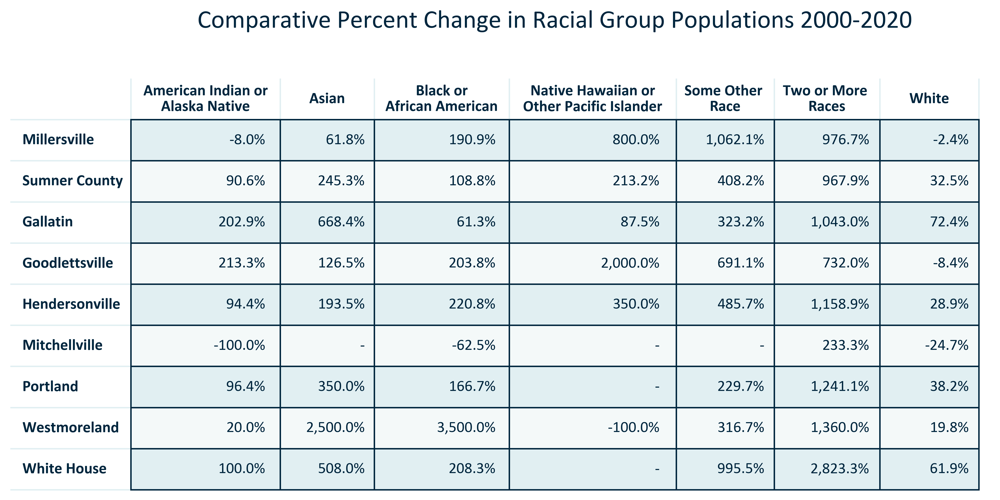

In [47]:
title = 'Comparative Percent Change in Racial Group Populations 2000-2020'
df_temp = reggeos
df_temp = df_temp.loc[df_temp['Time Frame'] == '2000-2020'].sort_values(by = 'NAME').set_index('NAME')
newcols = list(df_temp.index)
newcols.remove(primarygeo)
newcols.remove(county)
newcols = [county] + newcols
newcols = [primarygeo] + newcols
df_temp = df_temp.reindex(newcols)
df_temp = df_temp[['American Indian Alaska Native Alone % Change', 'Asian Alone % Change', 'Black or African American Alone % Change', 
                   'Native Hawaiian Other Pacific Islander Alone % Change','Some Other Race Alone % Change', 'Two or More Races % Change', 'White Alone % Change']]
df_temp.update(df_temp[['American Indian Alaska Native Alone % Change', 'Asian Alone % Change', 'Black or African American Alone % Change', 
                   'Native Hawaiian Other Pacific Islander Alone % Change','Some Other Race Alone % Change', 'Two or More Races % Change', 
                        'White Alone % Change']].applymap('{:,.1f}%'.format))
df_temp = df_temp.rename(columns = {'White Alone % Change': '      White      ', 'Black or African American Alone % Change': 'Black or\nAfrican American', 
                                    'American Indian Alaska Native Alone % Change': 'American Indian or\nAlaska Native', 'Asian Alone % Change': '      Asian      ', 
                                    'Native Hawaiian Other Pacific Islander Alone % Change': 'Native Hawaiian or\nOther Pacific Islander', 
                                    'Some Other Race Alone % Change': 'Some Other \nRace', 'Two or More Races % Change': 'Two or More \nRaces', 
                                    'Hispanic or Latino % Change': 'Hispanic or \nLatino'})
df_temp = df_temp.replace({'nan%':'-', 'inf%':'-'})
#set up table
indexlength = len(df_temp.index)
width = len(df_temp.columns)
#index length + 2 for merge column table
colours = tablecolors(indexlength, width)
colcolours = howwide(width)
rowcolours = howlong(indexlength)
#initiate figure and hide axes
fig, ax = plt.subplots()
fig.patch.set_visible(False)
ax.axis('off')
ax.axis('tight')
#initiate table and set parameters
table = ax.table(cellText = df_temp.values, colLabels = df_temp.columns, rowLabels = df_temp.index, loc = 'center', cellColours = colours, colColours = colcolours, 
                cellLoc = 'right', rowLoc = 'left', rowColours = rowcolours)
table.auto_set_column_width(col=list(range(len(df_temp.columns))))
ax.set_title(label = title, y = 1.1)
row_headers = df_temp.index
column_headers = df_temp.columns
table.scale(2.5, 2.5) #table scaling
allheaders(col1, col2, edge1, edge2)
#display and save
fig.savefig('../Figures/RACEETH_table_geocomparative_percentchangeracegroups_00to20.svg', bbox_inches='tight')
fig.savefig('../Figures/RACEETH_table_geocomparative_percentchangeracegroups_00to20.png', bbox_inches='tight')
with open('../Figures/RACEETH_table_geocomparative_percentchangeracegroups_00to20.txt', 'w') as text_file:
    text_file.write('Citation: 2000 and 2020 Decennial Census')
plt.show()
plt.close();

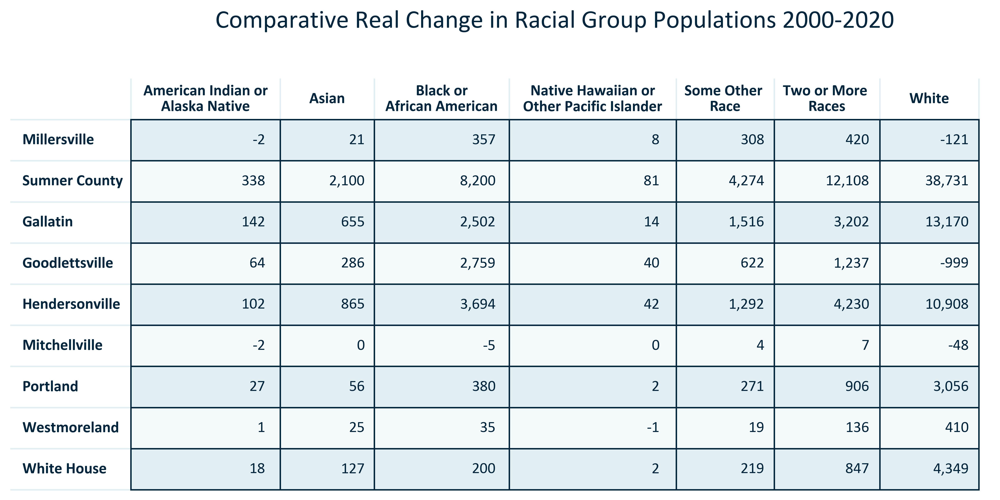

In [48]:
title = 'Comparative Real Change in Racial Group Populations 2000-2020'
df_temp = reggeos
df_temp = df_temp.loc[df_temp['Time Frame'] == '2000-2020'].sort_values(by = 'NAME').set_index('NAME')
newcols = list(df_temp.index)
newcols.remove(primarygeo)
newcols.remove(county)
newcols = [county] + newcols
newcols = [primarygeo] + newcols
df_temp = df_temp.reindex(newcols)
df_temp = df_temp[['American Indian Alaska Native Alone Change', 'Asian Alone Change', 'Black or African American Alone Change', 
                   'Native Hawaiian Other Pacific Islander Alone Change','Some Other Race Alone Change', 'Two or More Races Change', 'White Alone Change']]
df_temp.update(df_temp[['American Indian Alaska Native Alone Change', 'Asian Alone Change', 'Black or African American Alone Change', 
                   'Native Hawaiian Other Pacific Islander Alone Change','Some Other Race Alone Change', 'Two or More Races Change', 
                        'White Alone Change']].applymap('{:,.0f}'.format))
df_temp = df_temp.rename(columns = {'White Alone Change': '      White      ', 'Black or African American Alone Change': 'Black or\nAfrican American', 
                                    'American Indian Alaska Native Alone Change': 'American Indian or\nAlaska Native', 'Asian Alone Change': '      Asian      ', 
                                    'Native Hawaiian Other Pacific Islander Alone Change': 'Native Hawaiian or\nOther Pacific Islander', 
                                    'Some Other Race Alone Change': 'Some Other \nRace', 'Two or More Races Change': 'Two or More \nRaces', 
                                    'Hispanic or Latino Change': 'Hispanic or \nLatino'})
df_temp = df_temp.replace({'nan%':'-', 'inf%':'-'})
#set up table
indexlength = len(df_temp.index)
width = len(df_temp.columns)
#index length + 2 for merge column table
colours = tablecolors(indexlength, width)
colcolours = howwide(width)
rowcolours = howlong(indexlength)
#initiate figure and hide axes
fig, ax = plt.subplots()
fig.patch.set_visible(False)
ax.axis('off')
ax.axis('tight')
#initiate table and set parameters
table = ax.table(cellText = df_temp.values, colLabels = df_temp.columns, rowLabels = df_temp.index, loc = 'center', cellColours = colours, colColours = colcolours, 
                cellLoc = 'right', rowLoc = 'left', rowColours = rowcolours)
table.auto_set_column_width(col=list(range(len(df_temp.columns))))
ax.set_title(label = title, y = 1.1)
row_headers = df_temp.index
column_headers = df_temp.columns
table.scale(2.5, 2.5) #table scaling
allheaders(col1, col2, edge1, edge2)
#display and save
fig.savefig('../Figures/RACEETH_table_geocomparative_realchangeracegroups_00to20.svg', bbox_inches='tight')
fig.savefig('../Figures/RACEETH_table_geocomparative_realchangeracegroups_00to20.png', bbox_inches='tight')
with open('../Figures/RACEETH_table_geocomparative_realchangeracegroups_00to20.txt', 'w') as text_file:
    text_file.write('Citation: 2000 and 2020 Decennial Census')
plt.show()
plt.close();

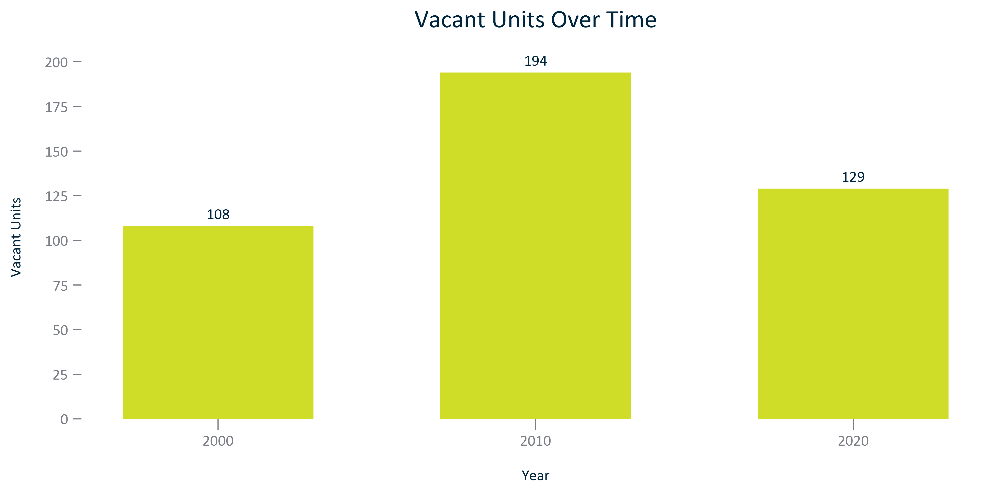

In [49]:
title = 'Vacant Units Over Time'
df_temp = Primary.loc[Primary['Time Frame'] == 'None']
df_temp = df_temp[['NAME', 'Year', 'Occupancy:Vacant Units']]
xinput = 'Year'
yinput = 'Occupancy:Vacant Units'
xlabel = xinput
ylabel = 'Vacant Units'
x = df_temp[xinput]
y = df_temp[yinput]
#initiate figure and set parameters
fig, ax = plt.subplots()
ax.bar(x, y, width = 6) 
ax.set(title = title, xlabel = xlabel, ylabel = ylabel) #set the title and axes labels
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter(numbernodecimalformat)) #y axis formatting
plt.locator_params(axis='x', nbins=3)
#data labels
singledatalabels(0, 5, "{:,.0f}")
#display and save
fig.savefig('../Figures/VACANCY_bar_primarygeo_vacantunits_overtime.svg', bbox_inches='tight')
fig.savefig('../Figures/VACANCY_bar_primarygeo_vacantunits_overtime.png', bbox_inches='tight')
with open('../Figures/VACANCY_bar_primarygeo_vacantunits_overtime.txt', 'w') as text_file:
    text_file.write('Citation: 2000, 2010, and 2020 Decennial Census')
plt.show()
plt.close();

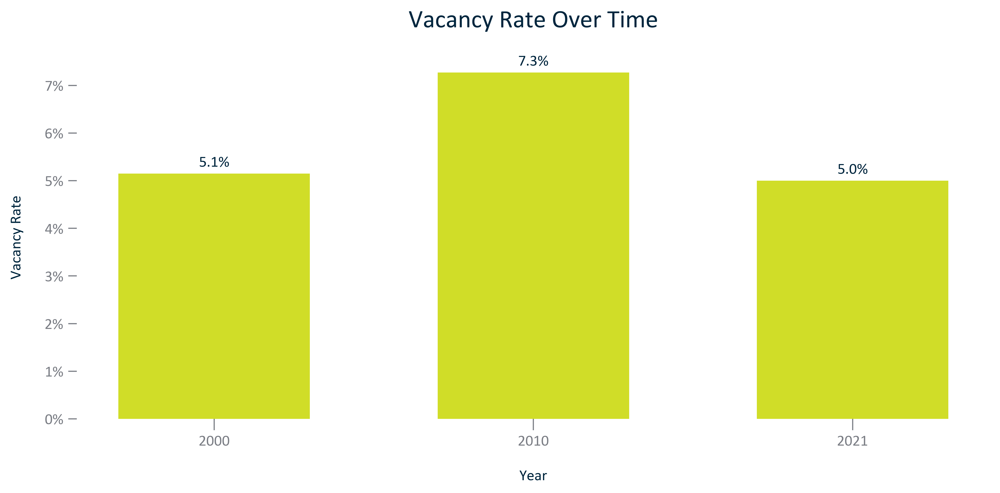

In [50]:
title = 'Vacancy Rate Over Time'
df_temp = Primary.loc[Primary['Time Frame'] == 'None']
df_temp = df_temp[['NAME', 'Year', 'Occupancy%:Vacant Units']]
xinput = 'Year'
yinput = 'Occupancy%:Vacant Units'
xlabel = xinput
ylabel = 'Vacancy Rate'
x = df_temp[xinput]
y = df_temp[yinput]
#initiate figure and set parameters
fig, ax = plt.subplots()
ax.bar(x, y, width = 6) 
ax.set(title = title, xlabel = xlabel, ylabel = ylabel) #set the title and axes labels
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter(percentnodecimalformat)) #y axis formatting
labels = ['2000', '2010', '2021']
plt.xticks(x, labels)
#data labels
singledatalabels(0, 5, "{:,.1f}%")
#display and save
fig.savefig('../Figures/VACANCY_bar_primarygeo_vacancyrate_overtime.svg', bbox_inches='tight')
fig.savefig('../Figures/VACANCY_bar_primarygeo_vacancyrate_overtime.png', bbox_inches='tight')
with open('../Figures/VACANCY_bar_primarygeo_vacancyrate_overtime.txt', 'w') as text_file:
    text_file.write('Citation: 2000, 2010, and 2020 Decennial Census')
plt.show()
plt.close();

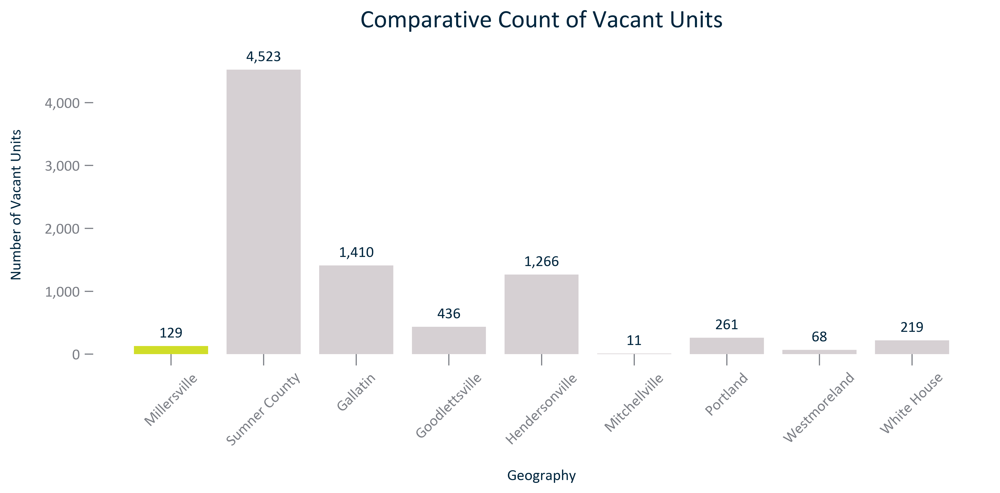

In [51]:
title = 'Comparative Count of Vacant Units'
df_temp = reggeos.loc[(reggeos['NAME'] != 'US')&(reggeos['NAME'] != 'Tennessee')&(reggeos['NAME'] != 'GNRC Region')]
df_temp = df_temp.loc[df_temp['Year'] == 2020.0].sort_values(by = 'NAME').set_index('NAME')
newcols = list(df_temp.index)
newcols.remove(primarygeo)
newcols.remove(county)
newcols = [county] + newcols
newcols = [primarygeo] + newcols
df_temp = df_temp.reindex(newcols).reset_index()
df_temp = df_temp[['NAME', 'Occupancy:Vacant Units']]
#df_temp = df_temp.sort_values(by = 'Occupancy:Vacant Units', ascending = False)
#initiate figure and set parameters
x = df_temp['NAME']
y = df_temp['Occupancy:Vacant Units']
xlabel = 'Geography'
ylabel = 'Number of Vacant Units'
#initiate figure and set parameters
fig, ax = plt.subplots()
bar_color = [C2 if i != primarygeo else C1 for i in x]
ax.bar(x, y, color = bar_color) 
ax.set(title = title, xlabel = xlabel, ylabel = ylabel) #set the title and axes labels
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter(numbernodecimalformat)) #y axis formatting
ax.tick_params(axis = 'x', which = 'major', rotation = 45)
#data labels
singledatalabels(0, 6, "{:,.0f}")
#display and save
fig.savefig('../Figures/VACANCY_bar_geocomparative_vacantunits_2020.svg', bbox_inches='tight')
fig.savefig('../Figures/VACANCY_bar_geocomparative_vacantunits_2020.png', bbox_inches='tight')
with open('../Figures/VACANCY_bar_geocomparative_vacantunits_2020.txt', 'w') as text_file:
    text_file.write('Citation: 2020 Decennial Census')
plt.show()
plt.close();

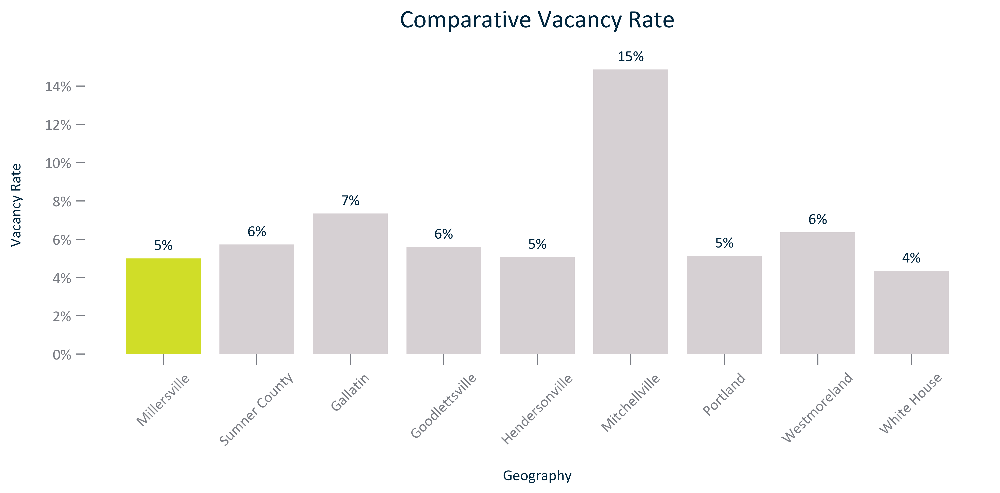

In [52]:
title = 'Comparative Vacancy Rate'
df_temp = reggeos.loc[reggeos['Year'] == 2020.0].sort_values(by = 'NAME').set_index('NAME')
newcols = list(df_temp.index)
newcols.remove(primarygeo)
newcols.remove(county)
newcols = [county] + newcols
newcols = [primarygeo] + newcols
df_temp = df_temp.reindex(newcols).reset_index()
df_temp = df_temp[['NAME', 'Occupancy%:Vacant Units']]
#df_temp = df_temp.sort_values(by = 'Occupancy %:Vacant Units', ascending = False)
#initiate figure and set parameters
x = df_temp['NAME']
y = df_temp['Occupancy%:Vacant Units']
xlabel = 'Geography'
ylabel = 'Vacancy Rate'
#initiate figure and set parameters
fig, ax = plt.subplots()
bar_color = [C2 if i != primarygeo else C1 for i in x]
ax.bar(x, y, color = bar_color) 
ax.set(title = title, xlabel = xlabel, ylabel = ylabel) #set the title and axes labels
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter(percentnodecimalformat)) #y axis formatting
ax.tick_params(axis = 'x', which = 'major', rotation = 45)
#data labels
singledatalabels(0, 6, "{:,.0f}%")
#display and save
fig.savefig('../Figures/VACANCY_bar_geocomparative_vacancyrate_2020.svg', bbox_inches='tight')
fig.savefig('../Figures/VACANCY_bar_geocomparative_vacancyrate_2020.png', bbox_inches='tight')
with open('../Figures/VACANCY_bar_geocomparative_vacancyrate_2020.txt', 'w') as text_file:
    text_file.write('Citation: 2020 Decennial Census')
plt.show()
plt.close();

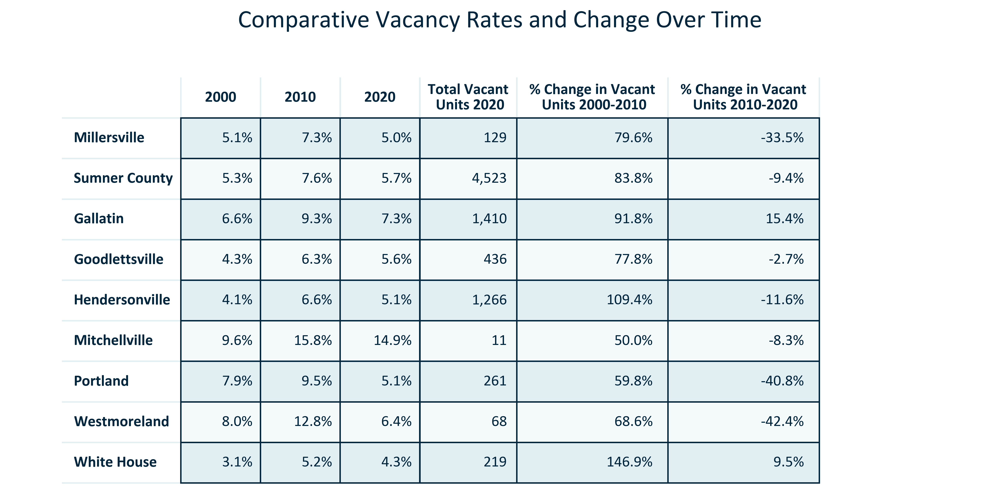

In [53]:
title = 'Comparative Vacancy Rates and Change Over Time'
df_temp = reggeost.sort_values(by = 'NAME').set_index('NAME')
newcols = list(df_temp.index)
newcols.remove(primarygeo)
newcols.remove(county)
newcols = [county] + newcols
newcols = [primarygeo] + newcols
df_temp = df_temp.reindex(newcols)
df_temp = df_temp[['Population 2020', 'Occupancy:Vacant Units 2000', 'Occupancy%:Vacant Units 2000', 'Occupancy%:Vacant Units 2010', 
                   'Occupancy%:Vacant Units 2020', 'Occupancy:Vacant Units 2010', 'Occupancy:Vacant Units 2020']]
#df_temp = df_temp.sort_values(by = 'Occupancy%:Vacant Units 2000', ascending = False)
df_temp['% Change in Vacant\n Units 2000-2010'] = prettypercentchange(df_temp['Occupancy:Vacant Units 2010'], df_temp['Occupancy:Vacant Units 2000'])
df_temp['% Change in Vacant\n Units 2010-2020'] = prettypercentchange(df_temp['Occupancy:Vacant Units 2020'], df_temp['Occupancy:Vacant Units 2010'])
df_temp = df_temp.drop(columns = ['Population 2020', 'Occupancy:Vacant Units 2010', 'Occupancy:Vacant Units 2000'])
df_temp = df_temp.rename(columns = {'Occupancy%:Vacant Units 2000': '     2000     ', 'Occupancy%:Vacant Units 2010': '     2010     ',
                                    'Occupancy%:Vacant Units 2020': '     2020     ', 'Occupancy:Vacant Units 2020': 'Total Vacant\n Units 2020'})
df_temp.update(df_temp[['     2000     ', '     2010     ', '     2020     ']].applymap('{:,.1f}%'.format))
df_temp.update(df_temp[['Total Vacant\n Units 2020']].applymap('{:,.0f}'.format))
#df_temp = df_temp.set_index('NAME')
#set up table
indexlength = len(df_temp.index)
width = len(df_temp.columns)
colours = tablecolors(indexlength, width)
colcolours = howwide(width)
rowcolours = howlong(indexlength)
#initiate figure and hide axes
fig, ax = plt.subplots()
fig.patch.set_visible(False)
ax.axis('off')
ax.axis('tight')
#initiate table and set parameters
table = ax.table(cellText = df_temp.values, colLabels = df_temp.columns, rowLabels = df_temp.index, loc = 'center', cellColours = colours, colColours = colcolours, 
                cellLoc = 'right', rowLoc = 'left', rowColours = rowcolours)
table.auto_set_column_width(col=list(range(len(df_temp.columns))))
ax.set_title(label = title, y = 1.1)
row_headers = df_temp.index
column_headers = df_temp.columns
table.scale(2, 2.5) #table scaling
allheaders(col1, col2, edge1, edge2)
#display and save
fig.savefig('../Figures/VACANCY_table_geocomparative_vacancyratesandchange_overtime.svg', bbox_inches='tight')
fig.savefig('../Figures/VACANCY_table_geocomparative_vacancyratesandchange_overtime.png', bbox_inches='tight')
with open('../Figures/VACANCY_table_geocomparative_vacancyratesandchange_overtime.txt', 'w') as text_file:
    text_file.write('Citation: 2000, 2010, and 2020 Decennial Census')
plt.show()
plt.close();